**Name:** Jagadeeshwari Mandapalli

**Banner ID:**001391239

# Introduction

### **1. Introduction**

This Notebook presents a analysis of Student retention and graduation rates using  dataset comes from the **higher education sector**, specifically focusing on **student retention and graduation rates**. It’s a valuable resource for **university administrators** and **educational policymakers** who want to understand what factors influence whether students graduate or not. By analyzing this data, universities can identify students who might need extra support, improve academic programs, and make better decisions to help more students succeed.

#### **Why This Matters**
- **For Universities**: Graduation rates are a key measure of success. Understanding what helps students graduate can lead to better programs, more effective support services, and happier, more successful students.
- **For Students**: When universities use this data to improve their services, students benefit from a better educational experience and a higher chance of graduating on time.

#### **What’s in the Dataset?**
The dataset includes information about students, such as their age, GPA, and financial aid status. Here’s a breakdown of the variables:

| **Variable Name**   | **Type**           | **Role**        | **What It Tells Us**                                                                 |
|----------------------|--------------------|-----------------|-------------------------------------------------------------------------------------|
| **Student ID**       | Nominal (Category) | Excluded        | A unique ID for each student. Not used in the analysis.                             |
| **Age**              | Ratio (Number)     | Predictor       | The student’s age. Older students might have different challenges or motivations.   |
| **Gender**           | Nominal (Category) | Predictor       | The student’s gender. This helps us see if graduation rates differ by gender.       |
| **GPA**              | Ratio (Number)     | Predictor       | The student’s Grade Point Average. Higher GPAs often mean a better chance of graduating. |
| **Credits Earned**   | Ratio (Number)     | Predictor       | How many credits the student has completed. More credits mean they’re closer to graduating. |
| **Financial Aid**    | Ratio (Number)     | Predictor       | How much financial aid the student receives. More aid might reduce stress and help them focus on studies. |
| **Enrollment Status**| Nominal (Category) | Predictor       | Whether the student is full-time, part-time, or on leave. Full-time students might graduate faster. |
| **Graduation Status**| Nominal (Category) | Outcome         | Whether the student graduated (Yes/No). This is what we’re trying to predict.       |

#### **Key Questions We’re Exploring**
1. **What factors most influence whether a student graduates?**
   - For example, does GPA play a bigger role than financial aid? Are older students more likely to graduate than younger ones?
2. **Can we predict graduation status accurately using this data?**
   - If we know a student’s age, GPA, and financial aid status, can we guess whether they’ll graduate?

#### **How This Helps**
- **Early Support**: By identifying students who might struggle to graduate, universities can offer help early, like tutoring or counseling.
- **Better Policies**: Policymakers can use this data to create programs that address specific challenges, like financial stress or balancing work and school.
- **Resource Allocation**: Universities can use this information to decide where to spend money, like increasing financial aid or hiring more advisors.

#### **What’s Next?**
- **Explore the Data**: We’ll look at the data to see how the variables are distributed and if there are any patterns or outliers.
- **Clean and Prepare**: We’ll handle missing data, fix any issues, and get the data ready for modeling.
- **Build Models**: We’ll use statistical and machine learning models to predict graduation status and see which factors matter most.
- **Draw Conclusions**: Based on the results, we’ll recommend actions universities can take to improve graduation rates.



**As a first step import and install all necessary libraries**

In [ ]:
!pip install pygam  # Install the pyGAM library
!pip install tensorflow # Install tensorflow

In [ ]:
# Data Manipulation and Analysis
import pandas as pd  # For dataframes
import numpy as np   # For numerical operations

# Data Preprocessing
from sklearn.preprocessing import StandardScaler, MinMaxScaler, OneHotEncoder  # Scaling and encoding
from sklearn.model_selection import train_test_split, KFold, RandomizedSearchCV  # Data splitting and cross-validation
from sklearn.impute import SimpleImputer  # Handling missing values
from sklearn.preprocessing import LabelEncoder

# Parametric Models
from sklearn.linear_model import LogisticRegression, LinearRegression, Lasso  # Logistic and linear regression
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, RandomForestRegressor  # Tree-based models
#from sklearn.gam import LinearGAM  # Generalized Additive Models (GAM) # Commented out incorrect import
from sklearn.metrics import classification_report, accuracy_score, roc_auc_score
from sklearn.metrics import confusion_matrix

from pygam import LinearGAM # Import LinearGAM from pygam instead
from sklearn.svm import SVC
from sklearn.decomposition import PCA

# Non-parametric Models
from xgboost import XGBClassifier, XGBRegressor  # XGBoost for classification and regression
from lightgbm import LGBMClassifier, LGBMRegressor  # LightGBM for classification and regression
from sklearn.cluster import KMeans
# Model Evaluation
from sklearn.metrics import (
    accuracy_score, recall_score, precision_score, f1_score,  # For classification
    mean_squared_error, r2_score  # For regression
)

from tensorflow.keras.models import Sequential #Import the Sequential model
from tensorflow.keras.layers import Dense # Import the Dense layer
# Visualization
import matplotlib.pyplot as plt  # For plotting
import seaborn as sns  # For enhanced visualizations

# Miscellaneous
import warnings  # To suppress warnings
warnings.filterwarnings('ignore')  # Ignore warnings for cleaner output

# Data Uploading

In [ ]:
from google.colab import files
# Debes subir: Student_Performance.xlsx
uploaded = files.upload()

Saving COLLEGE_RET_SV.xlsx to COLLEGE_RET_SV (4).xlsx


In [ ]:
# Load dataset
df = pd.read_excel('/content/COLLEGE_RET_SV.xlsx',sheet_name='DB')

In [ ]:
df.columns

Index(['ID', 'SEMESTER', 'MAJOR', 'ESTATUS', 'GENDER', 'ORIGIN',
       'FIRSTPART_GRADE', 'SECONDPARTIAL_GRADE', 'FINALEXAM_GRADE',
       'FINAL_GRADE', 'ABSENCES_FIRSTPARTIAL', 'ABSENCES_SECONDPARTIAL',
       'ABSENCES_THIRDDPARTIAL', 'NUMCOURSES_ONLINE', 'SCHOLARSHIP_PERCENT',
       'PASTDUE_BALANCE', 'NUMBSESSIONS_ADVISORY', 'NUMBSESSIONS_COUNSELING',
       'TUTORINGMATH_SESSIONS', 'FORMATIVEPLAN_Q5', 'TEACHEREVAL_Q1',
       'TEACHEREVAL_Q2', 'TEACHEREVAL_Q3', 'TEACHEREVAL_Q4', 'TEACHEREVAL_Q5',
       'TEACHEREVAL_Q6', 'TEACHEREVAL_Q7', 'TEACHEREVAL_Q8', 'TEACHEREVAL_Q9',
       'TEACHEREVAL_Q10', 'TEACHEREVAL_Q11', 'TEACHEREVAL_Q12',
       'TEACHEREVAL_Q13', 'TEACHEREVAL_Q14', 'TEACHEREVAL_Q15',
       'TEACHEREVAL_Q16', 'HONOR_FAULTS'],
      dtype='object')

In [ ]:
df.head()

,ID,SEMESTER,MAJOR,ESTATUS,GENDER,ORIGIN,FIRSTPART_GRADE,SECONDPARTIAL_GRADE,FINALEXAM_GRADE,FINAL_GRADE,...,TEACHEREVAL_Q8,TEACHEREVAL_Q9,TEACHEREVAL_Q10,TEACHEREVAL_Q11,TEACHEREVAL_Q12,TEACHEREVAL_Q13,TEACHEREVAL_Q14,TEACHEREVAL_Q15,TEACHEREVAL_Q16,HONOR_FAULTS
0,398471,8,Business,ENROLLED,FEMALE,Local,91.285714,89.285714,91.714286,85.428571,...,7.0,7.000000,6.000000,6.750000,7.000000,6.5,6.75,6.75,7.0,0
1,804181,5,Engineering,ENROLLED,MALE,Local,89.111111,92.555556,92.444444,91.444444,...,7.0,7.000000,7.000000,7.000000,7.000000,7.0,7.00,7.00,7.0,0
2,431091,1,Psychology,NOT ENROLLED,FEMALE,Foreign,98.545455,96.909091,98.363636,99.090909,...,6.0,6.285714,6.142857,6.142857,6.142857,6.0,6.00,6.00,6.0,0
3,741091,6,Engineering,ENROLLED,FEMALE,Local,89.555556,84.888889,90.777778,97.444444,...,7.0,7.000000,7.000000,7.000000,7.000000,7.0,7.00,7.00,7.0,0
4,274091,1,Industrial Design,ENROLLED,FEMALE,Local,83.300000,80.200000,79.800000,72.000000,...,7.0,7.000000,7.000000,7.000000,7.000000,7.0,7.00,7.00,7.0,0


In [ ]:
df.tail()

,ID,SEMESTER,MAJOR,ESTATUS,GENDER,ORIGIN,FIRSTPART_GRADE,SECONDPARTIAL_GRADE,FINALEXAM_GRADE,FINAL_GRADE,...,TEACHEREVAL_Q8,TEACHEREVAL_Q9,TEACHEREVAL_Q10,TEACHEREVAL_Q11,TEACHEREVAL_Q12,TEACHEREVAL_Q13,TEACHEREVAL_Q14,TEACHEREVAL_Q15,TEACHEREVAL_Q16,HONOR_FAULTS
6592,494446,1,Computer Science,ENROLLED,MALE,Local,64.727273,62.818182,63.454545,56.090909,...,6.333333,6.000000,6.333333,6.333333,6.333333,6.000000,6.000000,6.000000,6.333333,0
6593,405446,1,Medicine,ENROLLED,FEMALE,Foreign,76.750000,79.125000,82.500000,82.875000,...,6.666667,6.666667,6.666667,7.000000,7.000000,6.666667,6.666667,6.777778,7.000000,0
6594,325446,1,Marketing,ENROLLED,FEMALE,Local,91.384615,95.230769,91.846154,83.846154,...,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,0
6595,475446,1,Architecture,ENROLLED,MALE,Foreign,80.800000,82.800000,81.800000,79.400000,...,4.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,0
6596,295446,1,Architecture,ENROLLED,FEMALE,Local,95.363636,96.727273,97.727273,99.818182,...,7.000000,7.000000,7.000000,7.000000,6.500000,7.000000,7.000000,7.000000,7.000000,0


In [ ]:
print("There are", df.shape[0], 'rows and', df.shape[1], "columns.")

There are 6597 rows and 37 columns.


In [ ]:
# Display dataset information
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6597 entries, 0 to 6596
Data columns (total 37 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   ID                       6597 non-null   int64  
 1   SEMESTER                 6597 non-null   int64  
 2   MAJOR                    6597 non-null   object 
 3   ESTATUS                  6597 non-null   object 
 4   GENDER                   6597 non-null   object 
 5   ORIGIN                   6597 non-null   object 
 6   FIRSTPART_GRADE          6597 non-null   float64
 7   SECONDPARTIAL_GRADE      6597 non-null   float64
 8   FINALEXAM_GRADE          6597 non-null   float64
 9   FINAL_GRADE              6597 non-null   float64
 10  ABSENCES_FIRSTPARTIAL    6597 non-null   float64
 11  ABSENCES_SECONDPARTIAL   6597 non-null   float64
 12  ABSENCES_THIRDDPARTIAL   6597 non-null   float64
 13  NUMCOURSES_ONLINE        6597 non-null   int64  
 14  SCHOLARSHIP_PERCENT     

In [ ]:
df.describe()

,ID,SEMESTER,FIRSTPART_GRADE,SECONDPARTIAL_GRADE,FINALEXAM_GRADE,FINAL_GRADE,ABSENCES_FIRSTPARTIAL,ABSENCES_SECONDPARTIAL,ABSENCES_THIRDDPARTIAL,NUMCOURSES_ONLINE,...,TEACHEREVAL_Q8,TEACHEREVAL_Q9,TEACHEREVAL_Q10,TEACHEREVAL_Q11,TEACHEREVAL_Q12,TEACHEREVAL_Q13,TEACHEREVAL_Q14,TEACHEREVAL_Q15,TEACHEREVAL_Q16,HONOR_FAULTS
count,6597.000000,6597.000000,6597.000000,6597.000000,6597.000000,6597.000000,6597.000000,6597.000000,6597.000000,6597.0,...,6597.000000,6597.000000,6597.000000,6597.000000,6597.000000,6597.000000,6597.000000,6597.000000,6597.000000,6597.000000
mean,498351.854025,4.575868,88.327718,89.009948,89.550853,87.913994,0.202143,0.235322,0.245077,0.0,...,6.670781,6.684674,6.788076,6.708171,6.699109,6.712984,6.712875,6.729749,6.830670,0.013946
std,289411.942273,2.893272,8.570835,8.661992,8.249815,10.156159,0.321943,0.330737,0.531445,0.0,...,0.684956,0.654826,0.541282,0.639142,0.651891,0.633449,0.638774,0.620809,0.475368,0.124790
min,136.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000
25%,248363.000000,1.000000,84.363636,85.428571,86.166667,83.928571,0.000000,0.000000,0.000000,0.0,...,6.571429,6.625000,6.875000,6.666667,6.666667,6.666667,6.666667,6.714286,7.000000,0.000000
50%,499426.000000,4.000000,90.222222,91.000000,91.250000,90.166667,0.090909,0.125000,0.142857,0.0,...,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,0.000000
75%,748375.000000,7.000000,94.333333,94.923077,94.857143,94.444444,0.285714,0.333333,0.333333,0.0,...,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,0.000000
max,999885.000000,11.000000,100.000000,100.000000,192.888889,240.500000,3.714286,4.888889,24.500000,0.0,...,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,3.000000


In [ ]:
# Define the details about your variables here
variable_details = {
    'Student ID': {'Measurement Type': 'Nominal', 'Role': 'Excluded'},
    'Age': {'Measurement Type': 'Ratio', 'Role': 'Predictor'},
    'Gender': {'Measurement Type': 'Nominal', 'Role': 'Predictor'},
    'GPA': {'Measurement Type': 'Ratio', 'Role': 'Predictor'},
    'Credits Earned': {'Measurement Type': 'Ratio', 'Role': 'Predictor'},
    'Financial Aid': {'Measurement Type': 'Ratio', 'Role': 'Predictor'},
    'Enrollment Status': {'Measurement Type': 'Nominal', 'Role': 'Predictor'},
    'Graduation Status': {'Measurement Type': 'Nominal', 'Role': 'Outcome'}
}
variable_df = pd.DataFrame.from_dict(variable_details, orient='index')
variable_df.index.name = 'Variable Name'
variable_df.reset_index(inplace=True)
# Print the DataFrame
print(variable_df)

       Variable Name Measurement Type       Role
0         Student ID          Nominal   Excluded
1                Age            Ratio  Predictor
2             Gender          Nominal  Predictor
3                GPA            Ratio  Predictor
4     Credits Earned            Ratio  Predictor
5      Financial Aid            Ratio  Predictor
6  Enrollment Status          Nominal  Predictor
7  Graduation Status          Nominal    Outcome


# 2.Exploratory Analysis

In this section, we will perform exploratory data analysis (EDA) and preprocessing steps to prepare the dataset for modeling.

In [ ]:
# Check for missing values in each column
missing_values = df.isnull().sum()
print("Missing Values per Column:\n", missing_values)

# Decide on a strategy for handling missing values
# Imputation with the mean for numerical columns and the most frequent value for categorical columns

# Numerical Columns Imputation
numerical_cols = df.select_dtypes(include=np.number).columns
imputer_numerical = SimpleImputer(strategy='median')  # Or 'mean'
df[numerical_cols] = imputer_numerical.fit_transform(df[numerical_cols])

# Categorical Columns Imputation
categorical_cols = df.select_dtypes(exclude=np.number).columns
imputer_categorical = SimpleImputer(strategy='most_frequent')
df[categorical_cols] = imputer_categorical.fit_transform(df[categorical_cols])

# Verify if missing values have been handled
missing_values_after = df.isnull().sum()
print("\nMissing Values After Imputation:\n", missing_values_after)

Missing Values per Column:
 ID                         0
SEMESTER                   0
MAJOR                      0
ESTATUS                    0
GENDER                     0
ORIGIN                     0
FIRSTPART_GRADE            0
SECONDPARTIAL_GRADE        0
FINALEXAM_GRADE            0
FINAL_GRADE                0
ABSENCES_FIRSTPARTIAL      0
ABSENCES_SECONDPARTIAL     0
ABSENCES_THIRDDPARTIAL     0
NUMCOURSES_ONLINE          0
SCHOLARSHIP_PERCENT        0
PASTDUE_BALANCE            0
NUMBSESSIONS_ADVISORY      0
NUMBSESSIONS_COUNSELING    0
TUTORINGMATH_SESSIONS      0
FORMATIVEPLAN_Q5           0
TEACHEREVAL_Q1             0
TEACHEREVAL_Q2             0
TEACHEREVAL_Q3             0
TEACHEREVAL_Q4             0
TEACHEREVAL_Q5             0
TEACHEREVAL_Q6             0
TEACHEREVAL_Q7             0
TEACHEREVAL_Q8             0
TEACHEREVAL_Q9             0
TEACHEREVAL_Q10            0
TEACHEREVAL_Q11            0
TEACHEREVAL_Q12            0
TEACHEREVAL_Q13            0
TEACHEREVAL_Q14

In [ ]:
# Correct inconsistencies in categorical data (e.g., typos, different casing)
def correct_semester_inconsistencies(df):
    # Convert 'SEMESTER' column to lowercase for consistent case
    df['SEMESTER'] = df['SEMESTER'].str.lower()

    # Define a mapping for common typos or variations
    semester_mapping = {
        'fall': 'fall',
        'autumn': 'fall',  # Assuming 'autumn' is a synonym for 'fall'
        'spring': 'spring',
        'summer': 'summer',
        'winter': 'winter',
        # Add more mappings as needed based on observed typos/variations in your data
        'fal': 'fall',  # example typo
        'spr': 'spring'  # example typo
    }

    # Replace inconsistent semester values with corrected values
    df['SEMESTER'] = df['SEMESTER'].replace(semester_mapping)

    return df
    df = correct_semester_inconsistencies(df)
    print(df)

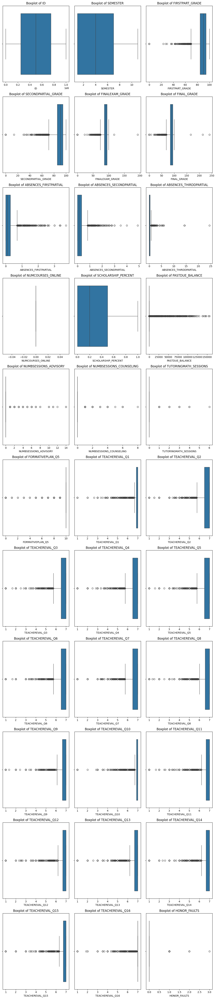

In [ ]:
# Select numeric columns
numeric_columns = df.select_dtypes(include=['float64', 'int64']).columns

# Calculate the number of rows needed to display all columns in sets of three
num_rows = (len(numeric_columns) + 2) // 3  # Adding two ensures any remainder gets its own row

plt.figure(figsize=(12, 5 * num_rows))

# Loop through the numeric columns and create subplots for each
for index, column in enumerate(numeric_columns):
    plt.subplot(num_rows, 3, index + 1)
    sns.boxplot(x=df[column])
    plt.title(f'Boxplot of {column}')

plt.tight_layout()
plt.show()

In [ ]:
# Identify categorical and numerical variables
numerical_vars = []  # Initialize the list

for col in df.columns:
    if df[col].dtype in ['float64', 'int64']: # Check data types
        numerical_vars.append(col)

# Now proceed with outlier handling
for col in numerical_vars:
  if col in df.columns:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    df = df[(df[col] >= lower_bound) & (df[col] <= upper_bound)]

In [ ]:
# Identify categorical and numerical variables
categorical_vars = []
numerical_vars = []

for col in df.columns:
    if df[col].dtype == 'object' or df[col].nunique() < 10:  # Consider variables with less than 10 unique values as categorical
      categorical_vars.append(col)
    else:
      numerical_vars.append(col)

print("Categorical variables:")
print(categorical_vars)
print("\nNumerical variables:")
numerical_vars

Categorical variables:
['MAJOR', 'ESTATUS', 'GENDER', 'ORIGIN', 'NUMCOURSES_ONLINE', 'PASTDUE_BALANCE', 'NUMBSESSIONS_ADVISORY', 'NUMBSESSIONS_COUNSELING', 'TUTORINGMATH_SESSIONS', 'FORMATIVEPLAN_Q5', 'TEACHEREVAL_Q1', 'TEACHEREVAL_Q2', 'TEACHEREVAL_Q3', 'TEACHEREVAL_Q4', 'TEACHEREVAL_Q5', 'TEACHEREVAL_Q6', 'TEACHEREVAL_Q7', 'TEACHEREVAL_Q8', 'TEACHEREVAL_Q9', 'TEACHEREVAL_Q10', 'TEACHEREVAL_Q11', 'TEACHEREVAL_Q12', 'TEACHEREVAL_Q13', 'TEACHEREVAL_Q14', 'TEACHEREVAL_Q15', 'TEACHEREVAL_Q16', 'HONOR_FAULTS']

Numerical variables:


['ID',
 'SEMESTER',
 'FIRSTPART_GRADE',
 'SECONDPARTIAL_GRADE',
 'FINALEXAM_GRADE',
 'FINAL_GRADE',
 'ABSENCES_FIRSTPARTIAL',
 'ABSENCES_SECONDPARTIAL',
 'ABSENCES_THIRDDPARTIAL',
 'SCHOLARSHIP_PERCENT']

                        SEMESTER  FIRSTPART_GRADE  SECONDPARTIAL_GRADE  \
SEMESTER                1.000000         0.069957             0.089985   
FIRSTPART_GRADE         0.069957         1.000000             0.755125   
SECONDPARTIAL_GRADE     0.089985         0.755125             1.000000   
FINALEXAM_GRADE         0.091709         0.874848             0.880813   
FINAL_GRADE             0.125221         0.684489             0.707224   
ABSENCES_FIRSTPARTIAL   0.107360        -0.256733            -0.250582   
ABSENCES_SECONDPARTIAL  0.024932        -0.190654            -0.283993   
ABSENCES_THIRDDPARTIAL -0.019981        -0.102061            -0.100853   
SCHOLARSHIP_PERCENT     0.000694         0.363199             0.383710   

                        FINALEXAM_GRADE  FINAL_GRADE  ABSENCES_FIRSTPARTIAL  \
SEMESTER                       0.091709     0.125221               0.107360   
FIRSTPART_GRADE                0.874848     0.684489              -0.256733   
SECONDPARTIAL_GRADE   

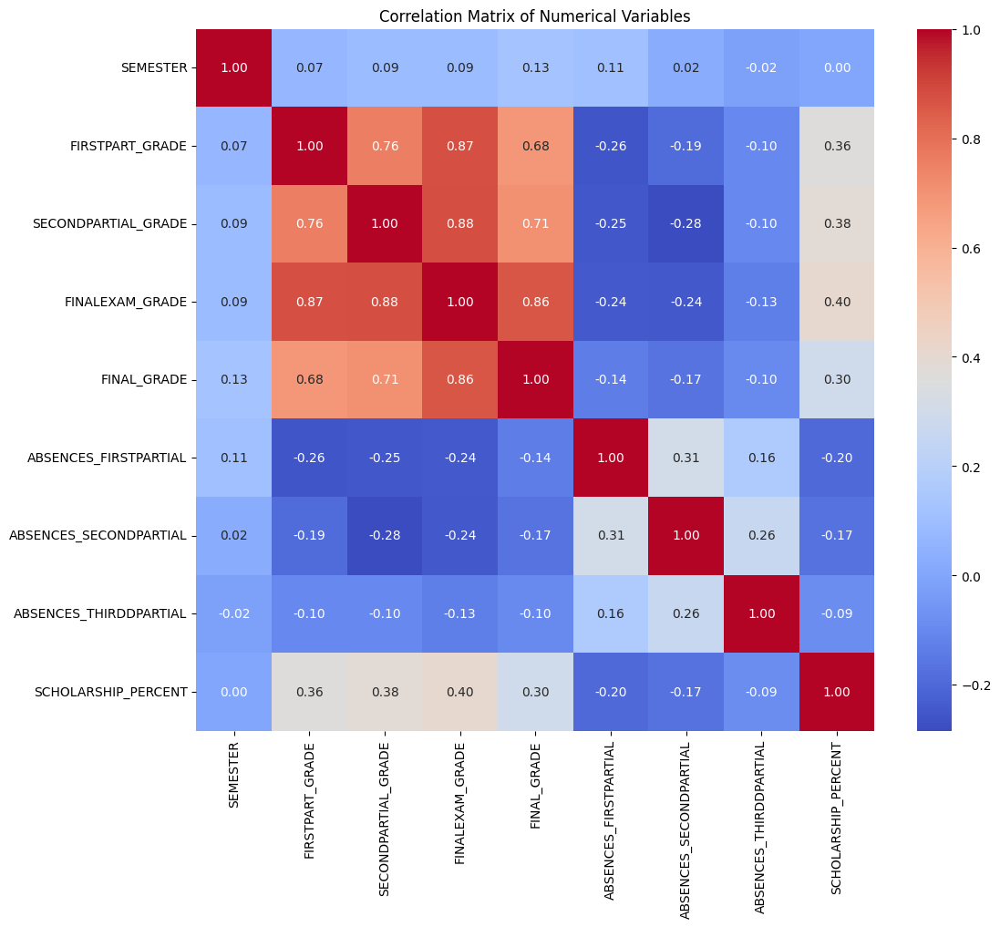

In [ ]:
# Calculate the correlation matrix for numerical variables
# Update numerical_vars to exclude 'ID' since it's been removed
numerical_vars = [var for var in numerical_vars if var != 'ID']
correlation_matrix = df[numerical_vars].corr()

# Display the correlation matrix
print(correlation_matrix)

# Visualize the correlation matrix using a heatmap
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix of Numerical Variables')
plt.show()

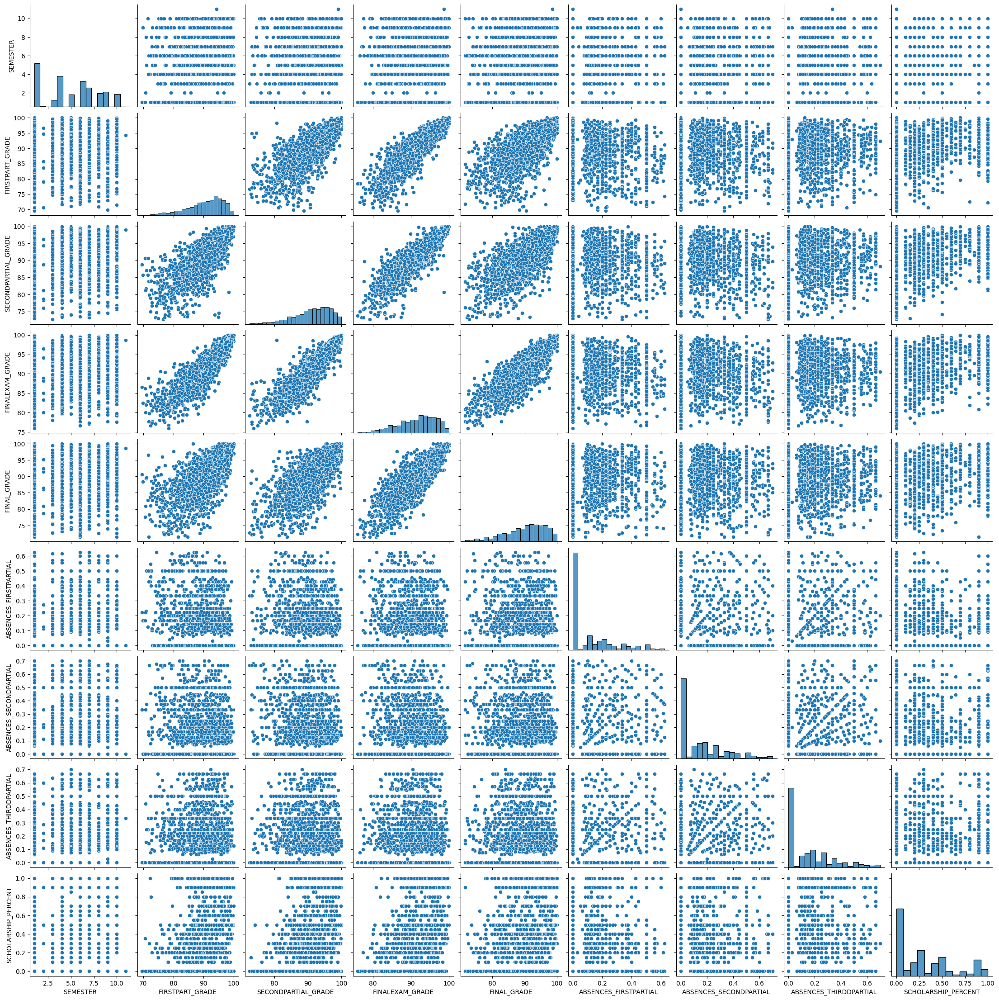

In [ ]:
# Create scatter plots for pairs of continuous variables
sns.pairplot(df[numerical_vars])
plt.show()

Categorical columns in the dataset:
Index(['MAJOR', 'ESTATUS', 'GENDER', 'ORIGIN'], dtype='object')

Cross-tabulation between MAJOR and ESTATUS:
ESTATUS                   ENROLLED  NOT ENROLLED
MAJOR                                           
Architecture                   123             1
Automotive Engineering           6             0
Bioengineering                  26             0
Business                       156             0
Civil Engineering                7             0
Communications                  21             0
Computer Science                31             0
Dentistry                       60             0
Design                          61             0
Economics                       27             0
Engineering                    101             0
Engineering Management          66             1
Finance                         42             0
Graphic Design                 107             1
Humanities                       1             0
Industrial Design     

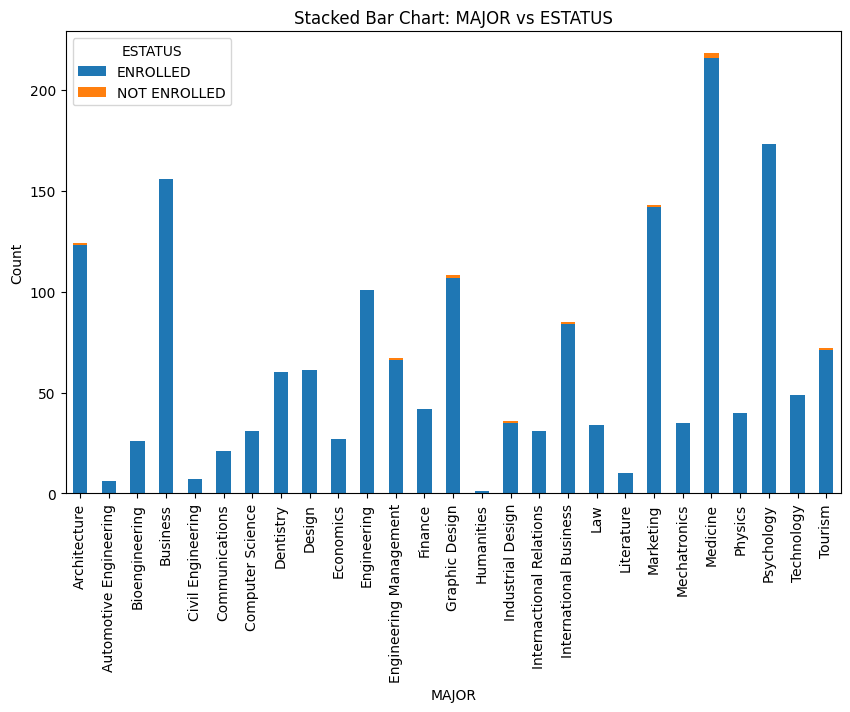


Normalized Cross-tabulation (Proportions by Row) between MAJOR and ESTATUS:
ESTATUS                   ENROLLED  NOT ENROLLED
MAJOR                                           
Architecture              0.991935      0.008065
Automotive Engineering    1.000000      0.000000
Bioengineering            1.000000      0.000000
Business                  1.000000      0.000000
Civil Engineering         1.000000      0.000000
Communications            1.000000      0.000000
Computer Science          1.000000      0.000000
Dentistry                 1.000000      0.000000
Design                    1.000000      0.000000
Economics                 1.000000      0.000000
Engineering               1.000000      0.000000
Engineering Management    0.985075      0.014925
Finance                   1.000000      0.000000
Graphic Design            0.990741      0.009259
Humanities                1.000000      0.000000
Industrial Design         0.972222      0.027778
Internactional Relations  1.000000      0

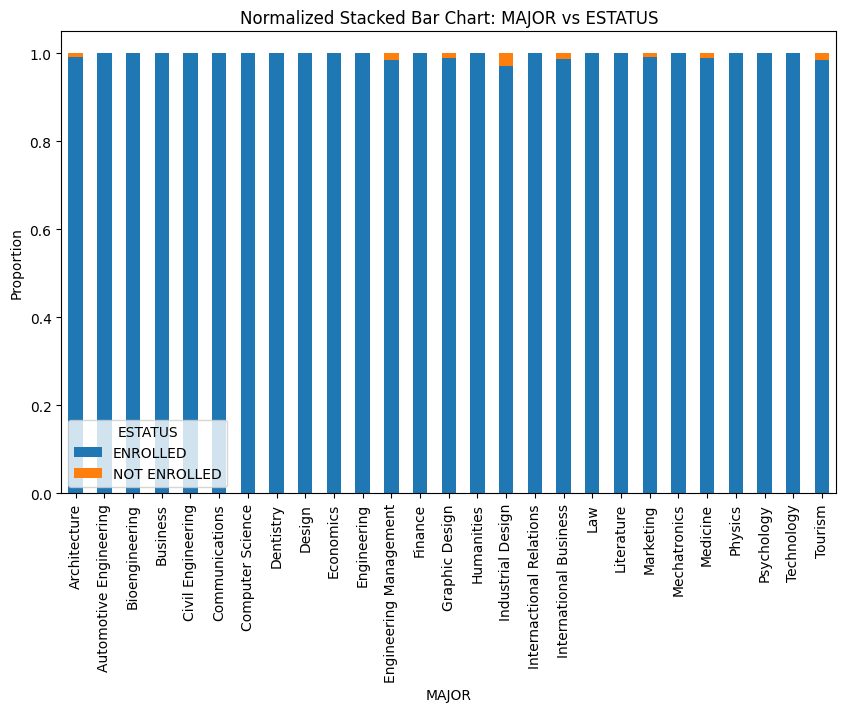


Cross-tabulation between MAJOR and GENDER:
GENDER                    FEMALE  MALE
MAJOR                                 
Architecture                 100    24
Automotive Engineering         1     5
Bioengineering                14    12
Business                      61    95
Civil Engineering              2     5
Communications                13     8
Computer Science               6    25
Dentistry                     56     4
Design                        42    19
Economics                     12    15
Engineering                   52    49
Engineering Management        27    40
Finance                       14    28
Graphic Design                82    26
Humanities                     1     0
Industrial Design             26    10
Internactional Relations      24     7
International Business        45    40
Law                           20    14
Literature                     8     2
Marketing                    116    27
Mechatronics                   4    31
Medicine            

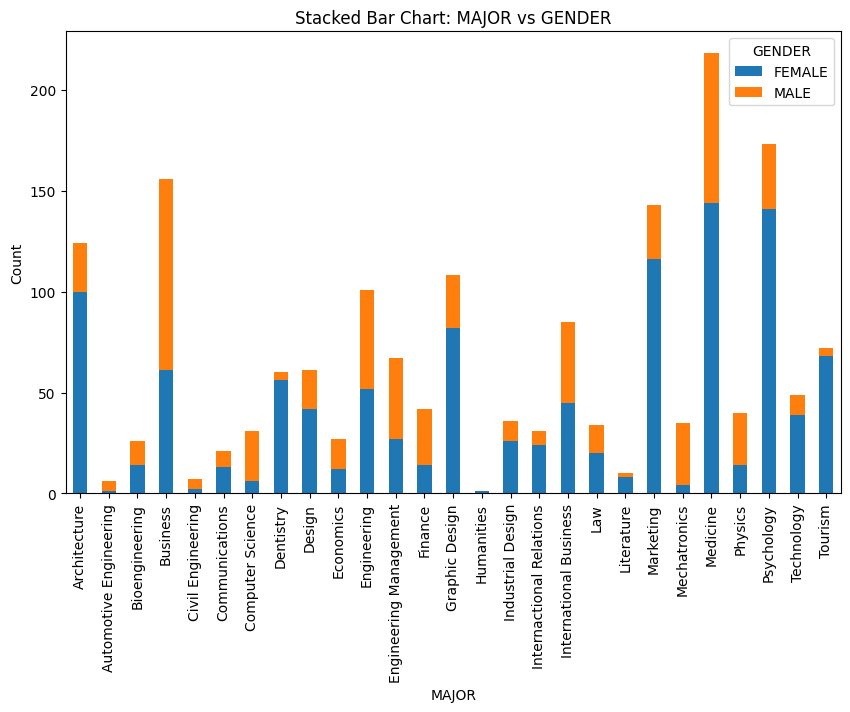


Normalized Cross-tabulation (Proportions by Row) between MAJOR and GENDER:
GENDER                      FEMALE      MALE
MAJOR                                       
Architecture              0.806452  0.193548
Automotive Engineering    0.166667  0.833333
Bioengineering            0.538462  0.461538
Business                  0.391026  0.608974
Civil Engineering         0.285714  0.714286
Communications            0.619048  0.380952
Computer Science          0.193548  0.806452
Dentistry                 0.933333  0.066667
Design                    0.688525  0.311475
Economics                 0.444444  0.555556
Engineering               0.514851  0.485149
Engineering Management    0.402985  0.597015
Finance                   0.333333  0.666667
Graphic Design            0.759259  0.240741
Humanities                1.000000  0.000000
Industrial Design         0.722222  0.277778
Internactional Relations  0.774194  0.225806
International Business    0.529412  0.470588
Law                     

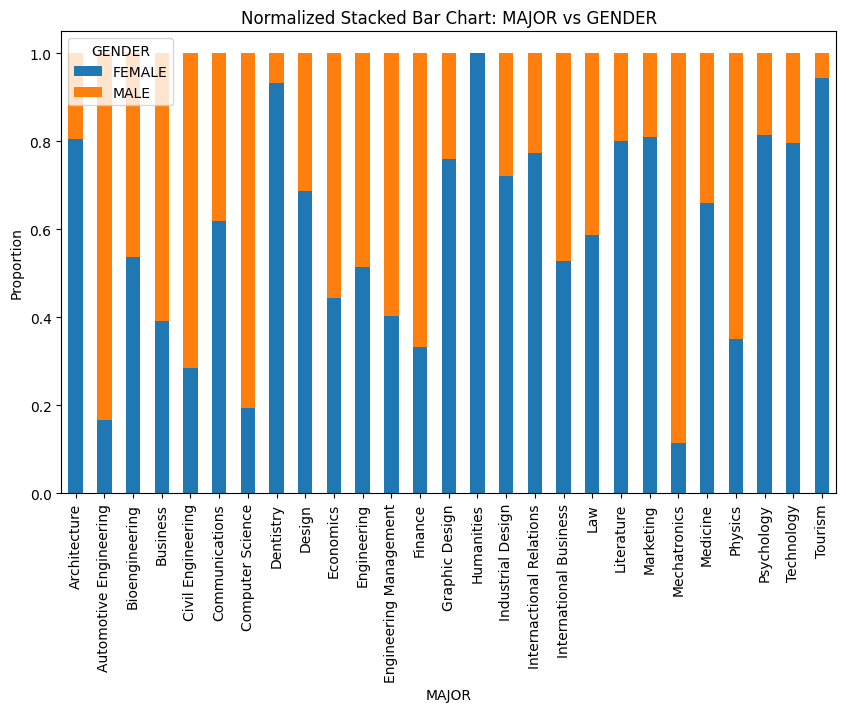


Cross-tabulation between MAJOR and ORIGIN:
ORIGIN                    Foreign  International  Local
MAJOR                                                  
Architecture                   41              0     83
Automotive Engineering          2              0      4
Bioengineering                  9              0     17
Business                       44              0    112
Civil Engineering               3              0      4
Communications                  8              0     13
Computer Science                1              0     30
Dentistry                      21              1     38
Design                         24              0     37
Economics                       4              1     22
Engineering                    18              0     83
Engineering Management         11              0     56
Finance                        15              0     27
Graphic Design                 33              0     75
Humanities                      1              0      0
Indu

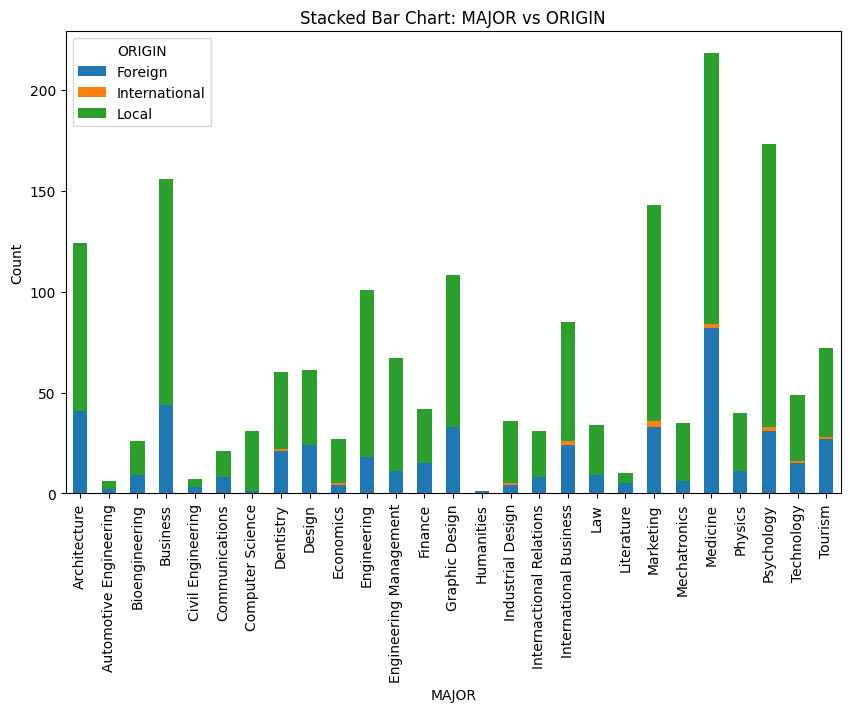


Normalized Cross-tabulation (Proportions by Row) between MAJOR and ORIGIN:
ORIGIN                     Foreign  International     Local
MAJOR                                                      
Architecture              0.330645       0.000000  0.669355
Automotive Engineering    0.333333       0.000000  0.666667
Bioengineering            0.346154       0.000000  0.653846
Business                  0.282051       0.000000  0.717949
Civil Engineering         0.428571       0.000000  0.571429
Communications            0.380952       0.000000  0.619048
Computer Science          0.032258       0.000000  0.967742
Dentistry                 0.350000       0.016667  0.633333
Design                    0.393443       0.000000  0.606557
Economics                 0.148148       0.037037  0.814815
Engineering               0.178218       0.000000  0.821782
Engineering Management    0.164179       0.000000  0.835821
Finance                   0.357143       0.000000  0.642857
Graphic Design          

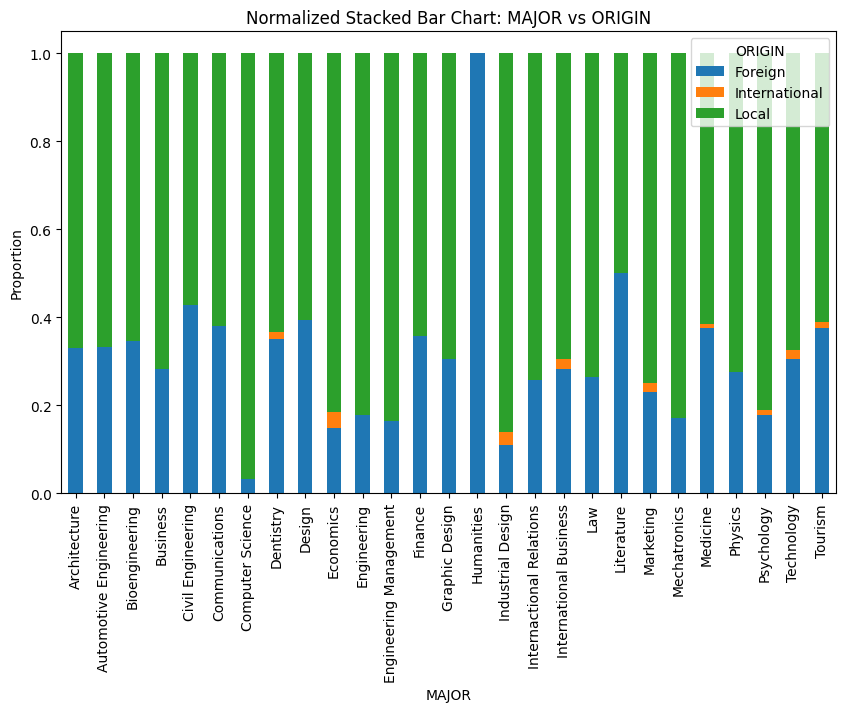


Cross-tabulation between ESTATUS and GENDER:
GENDER        FEMALE  MALE
ESTATUS                   
ENROLLED        1125   630
NOT ENROLLED       7     2


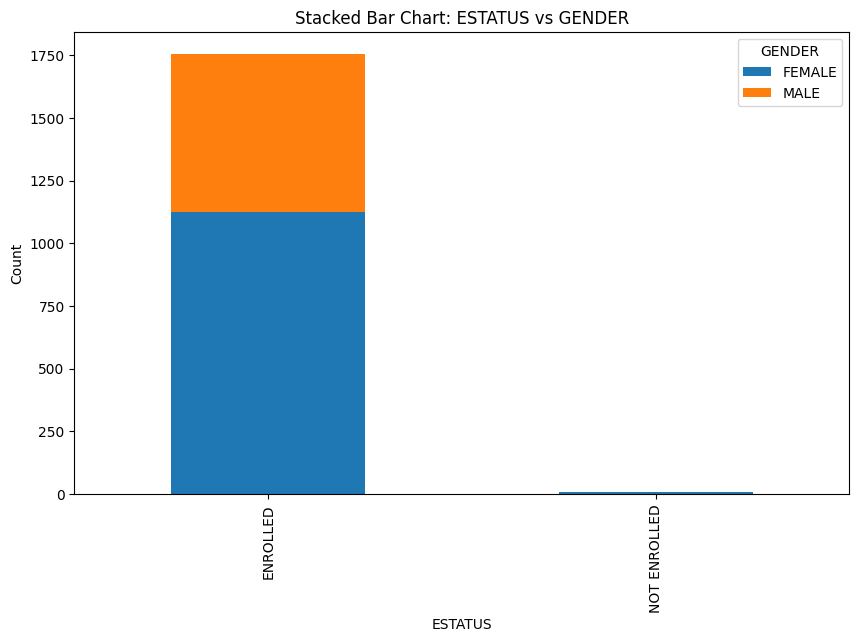


Normalized Cross-tabulation (Proportions by Row) between ESTATUS and GENDER:
GENDER          FEMALE      MALE
ESTATUS                         
ENROLLED      0.641026  0.358974
NOT ENROLLED  0.777778  0.222222


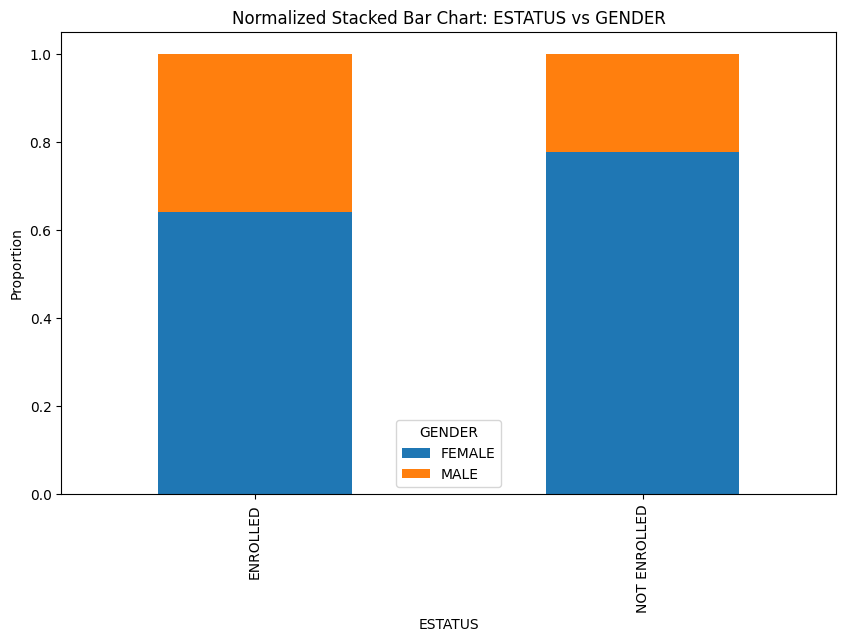


Cross-tabulation between ESTATUS and ORIGIN:
ORIGIN        Foreign  International  Local
ESTATUS                                    
ENROLLED          488             14   1253
NOT ENROLLED        2              0      7


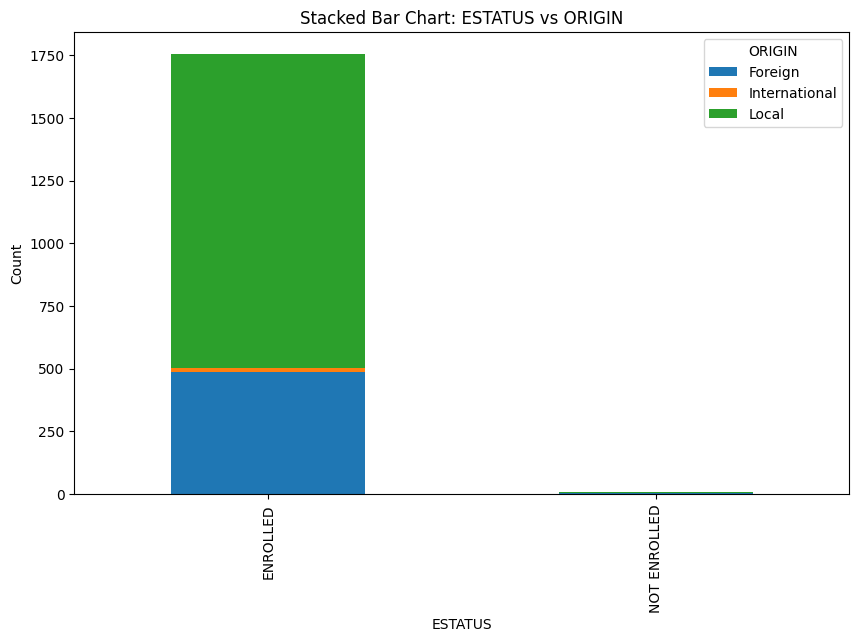


Normalized Cross-tabulation (Proportions by Row) between ESTATUS and ORIGIN:
ORIGIN         Foreign  International     Local
ESTATUS                                        
ENROLLED      0.278063       0.007977  0.713960
NOT ENROLLED  0.222222       0.000000  0.777778


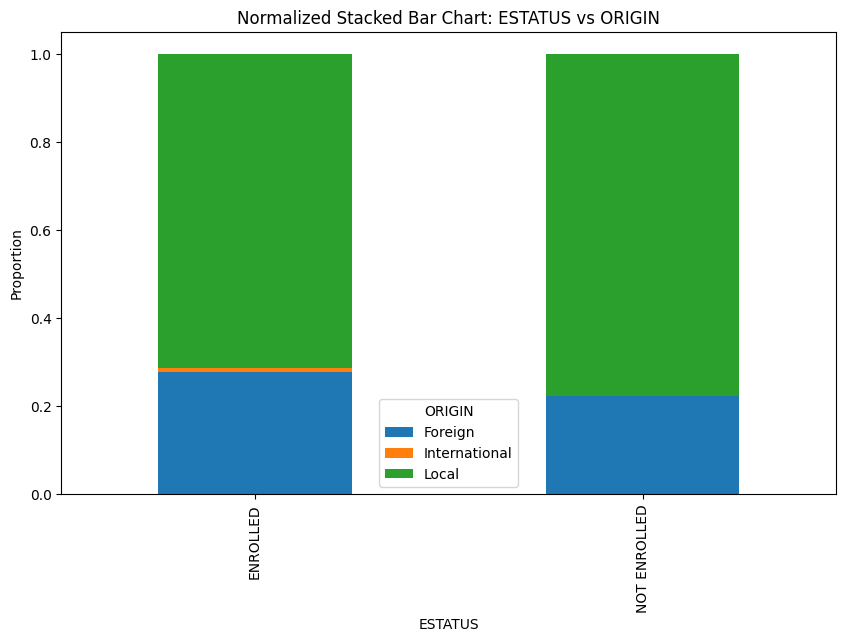


Cross-tabulation between GENDER and ORIGIN:
ORIGIN  Foreign  International  Local
GENDER                               
FEMALE      328             12    792
MALE        162              2    468


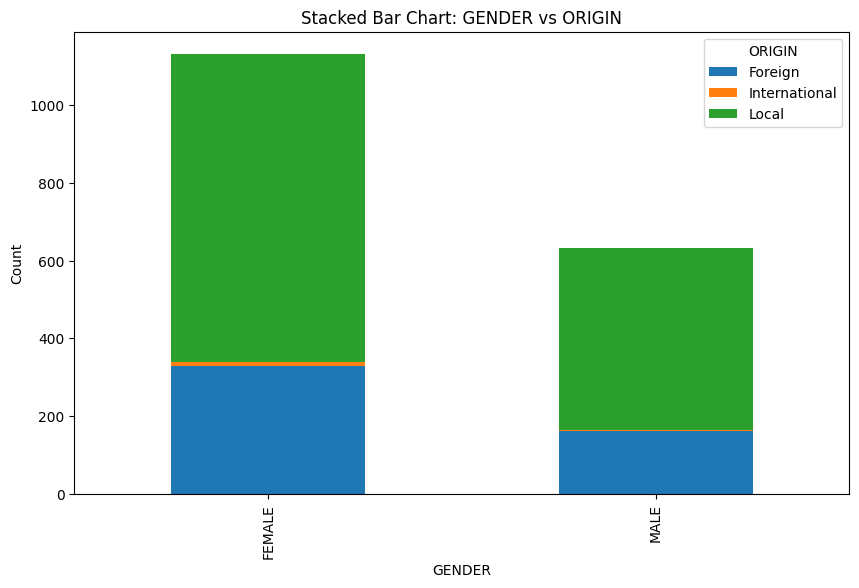


Normalized Cross-tabulation (Proportions by Row) between GENDER and ORIGIN:
ORIGIN   Foreign  International     Local
GENDER                                   
FEMALE  0.289753       0.010601  0.699647
MALE    0.256329       0.003165  0.740506


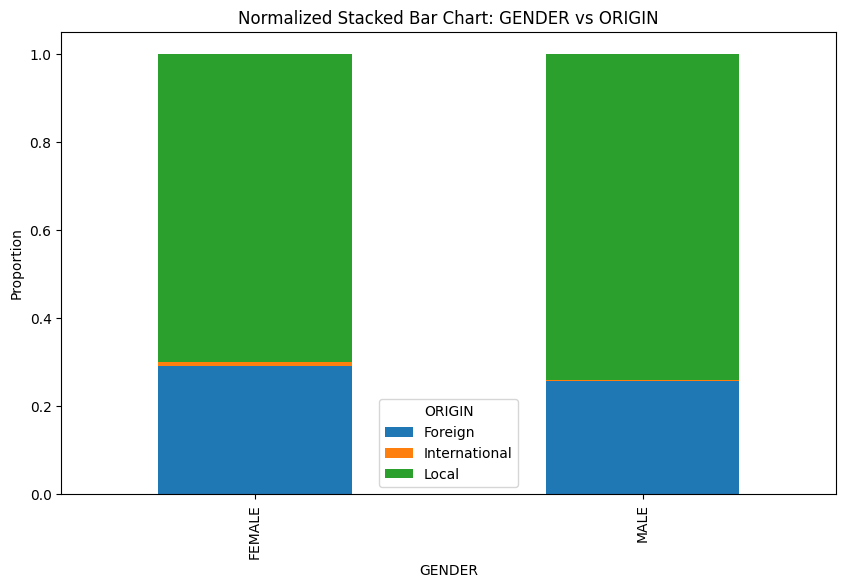

In [ ]:
# Step 1: Identify all categorical variables
categorical_columns = df.select_dtypes(include=['object', 'category']).columns
print("Categorical columns in the dataset:")
print(categorical_columns)

# Step 2: Create cross-tabulations and stacked bar charts for all pairs of categorical variables
for i in range(len(categorical_columns)):
    for j in range(i + 1, len(categorical_columns)):
        col1 = categorical_columns[i]
        col2 = categorical_columns[j]

        # Create cross-tabulation
        cross_tab = pd.crosstab(df[col1], df[col2])
        print(f"\nCross-tabulation between {col1} and {col2}:")
        print(cross_tab)

        # Create stacked bar chart
        cross_tab.plot(kind='bar', stacked=True, figsize=(10, 6))
        plt.title(f'Stacked Bar Chart: {col1} vs {col2}')
        plt.xlabel(col1)
        plt.ylabel('Count')
        plt.legend(title=col2)
        plt.show()

        # Create normalized cross-tabulation (proportions by row)
        normalized_cross_tab = pd.crosstab(df[col1], df[col2], normalize='index')
        print(f"\nNormalized Cross-tabulation (Proportions by Row) between {col1} and {col2}:")
        print(normalized_cross_tab)

        # Create normalized stacked bar chart
        normalized_cross_tab.plot(kind='bar', stacked=True, figsize=(10, 6))
        plt.title(f'Normalized Stacked Bar Chart: {col1} vs {col2}')
        plt.xlabel(col1)
        plt.ylabel('Proportion')
        plt.legend(title=col2)
        plt.show()

Numerical columns in the dataset:
Index(['ID', 'SEMESTER', 'FIRSTPART_GRADE', 'SECONDPARTIAL_GRADE',
       'FINALEXAM_GRADE', 'FINAL_GRADE', 'ABSENCES_FIRSTPARTIAL',
       'ABSENCES_SECONDPARTIAL', 'ABSENCES_THIRDDPARTIAL', 'NUMCOURSES_ONLINE',
       'SCHOLARSHIP_PERCENT', 'PASTDUE_BALANCE', 'NUMBSESSIONS_ADVISORY',
       'NUMBSESSIONS_COUNSELING', 'TUTORINGMATH_SESSIONS', 'FORMATIVEPLAN_Q5',
       'TEACHEREVAL_Q1', 'TEACHEREVAL_Q2', 'TEACHEREVAL_Q3', 'TEACHEREVAL_Q4',
       'TEACHEREVAL_Q5', 'TEACHEREVAL_Q6', 'TEACHEREVAL_Q7', 'TEACHEREVAL_Q8',
       'TEACHEREVAL_Q9', 'TEACHEREVAL_Q10', 'TEACHEREVAL_Q11',
       'TEACHEREVAL_Q12', 'TEACHEREVAL_Q13', 'TEACHEREVAL_Q14',
       'TEACHEREVAL_Q15', 'TEACHEREVAL_Q16', 'HONOR_FAULTS'],
      dtype='object')

Categorical columns in the dataset:
Index(['MAJOR', 'ESTATUS', 'GENDER', 'ORIGIN'], dtype='object')

Generating Pair Plots for numerical variables...


                        SEMESTER  FIRSTPART_GRADE  SECONDPARTIAL_GRADE  \
SEMESTER                1.000000         0.069957             0.089985   
FIRSTPART_GRADE         0.069957         1.000000             0.755125   
SECONDPARTIAL_GRADE     0.089985         0.755125             1.000000   
FINALEXAM_GRADE         0.091709         0.874848             0.880813   
FINAL_GRADE             0.125221         0.684489             0.707224   
ABSENCES_FIRSTPARTIAL   0.107360        -0.256733            -0.250582   
ABSENCES_SECONDPARTIAL  0.024932        -0.190654            -0.283993   
ABSENCES_THIRDDPARTIAL -0.019981        -0.102061            -0.100853   
SCHOLARSHIP_PERCENT     0.000694         0.363199             0.383710   

                        FINALEXAM_GRADE  FINAL_GRADE  ABSENCES_FIRSTPARTIAL  \
SEMESTER                       0.091709     0.125221               0.107360   
FIRSTPART_GRADE                0.874848     0.684489              -0.256733   
SECONDPARTIAL_GRADE   

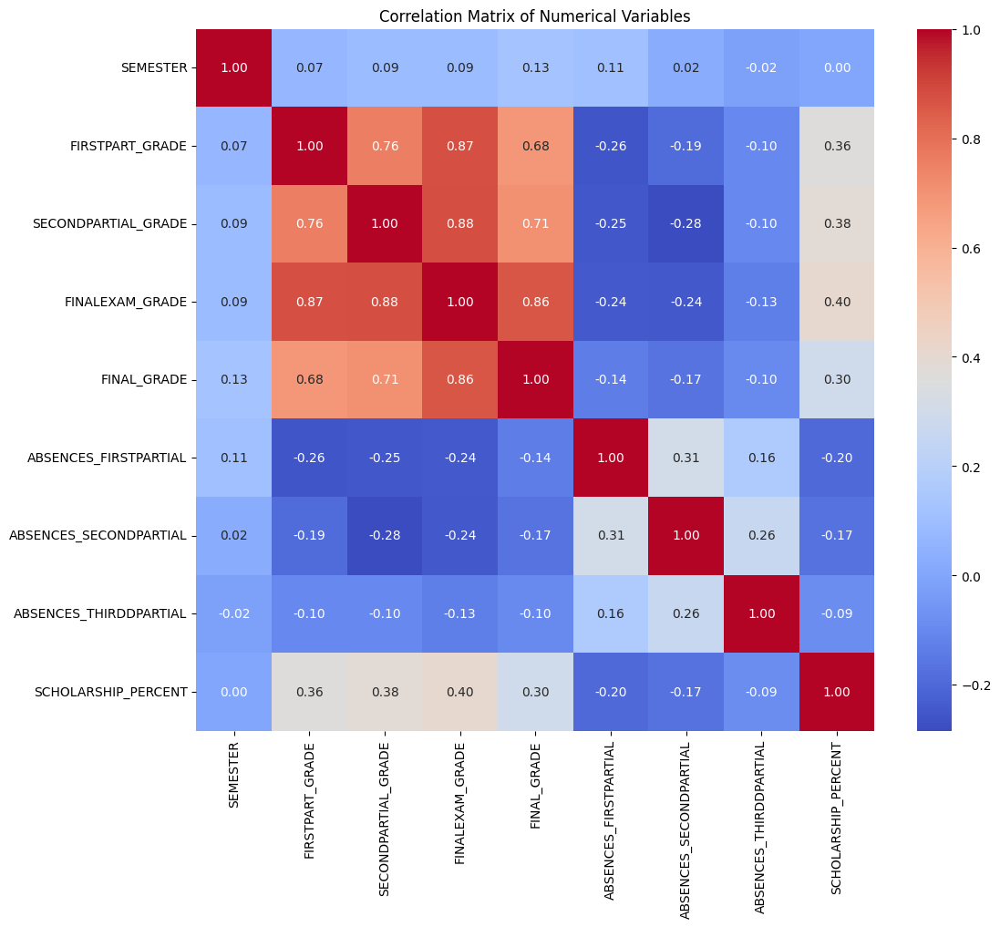


Generating Scatter Plot with Hue for 3 variables...


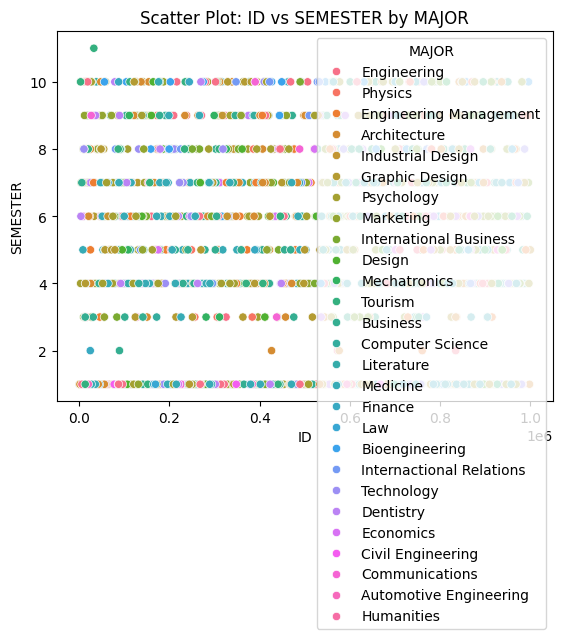


Generating Grouped Bar Plot for 3 variables...


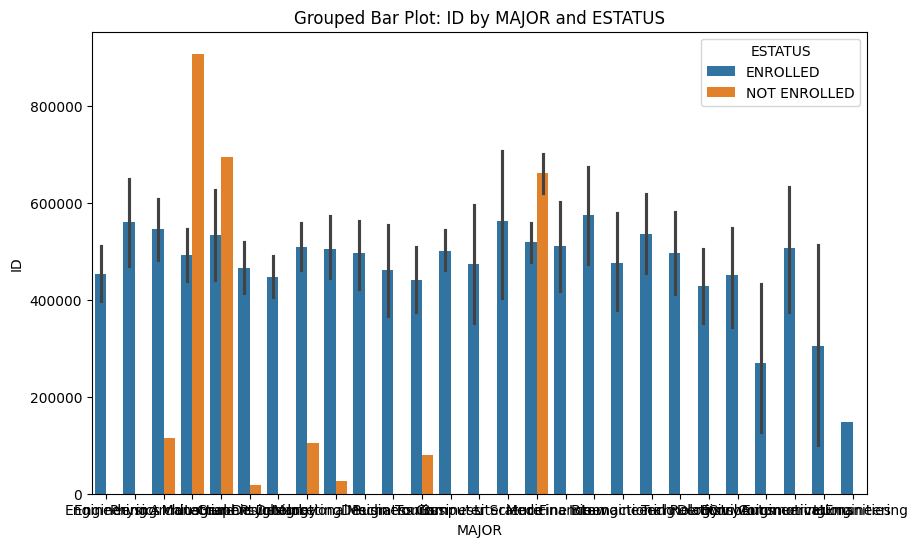


Generating Heatmap for 3 variables...


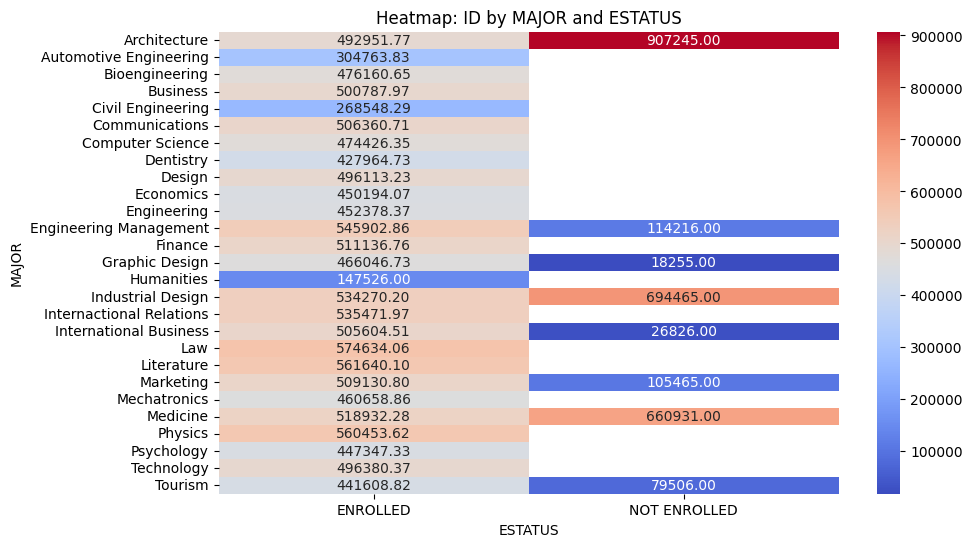

In [ ]:
# Step 1: Identify numerical and categorical variables
numerical_columns = df.select_dtypes(include=['int64', 'float64']).columns
categorical_columns = df.select_dtypes(include=['object', 'category']).columns

print("Numerical columns in the dataset:")
print(numerical_columns)
print("\nCategorical columns in the dataset:")
print(categorical_columns)

# Step 2: Pair Plots (for numerical variables)
# Pair plots help visualize pairwise relationships and distributions
if len(numerical_columns) > 1:
    print("\nGenerating Pair Plots for numerical variables...")
    sns.pairplot(df[numerical_columns])
    plt.suptitle("Pair Plots for Numerical Variables", y=1.02)
    plt.show()
else:
    print("\nNot enough numerical variables for pair plots.")

# Calculate the correlation matrix for numerical variables
# Update numerical_vars to exclude 'ID' since it's been removed
numerical_vars = [var for var in numerical_vars if var != 'ID']
correlation_matrix = df[numerical_vars].corr()

# Display the correlation matrix
print(correlation_matrix)

# Visualize the correlation matrix using a heatmap
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix of Numerical Variables')
plt.show()

# Step 4: Advanced Visualizations for Three or More Variables
# Example 1: Scatter plot with hue (3 variables: 2 numerical + 1 categorical)
if len(numerical_columns) >= 2 and len(categorical_columns) >= 1:
    print("\nGenerating Scatter Plot with Hue for 3 variables...")
    sns.scatterplot(data=df, x=numerical_columns[0], y=numerical_columns[1], hue=categorical_columns[0])
    plt.title(f"Scatter Plot: {numerical_columns[0]} vs {numerical_columns[1]} by {categorical_columns[0]}")
    plt.show()
else:
    print("\nNot enough variables for a scatter plot with hue.")

# Example 2: Grouped bar plot (3 variables: 1 numerical + 2 categorical)
if len(numerical_columns) >= 1 and len(categorical_columns) >= 2:
    print("\nGenerating Grouped Bar Plot for 3 variables...")
    plt.figure(figsize=(10, 6))
    sns.barplot(data=df, x=categorical_columns[0], y=numerical_columns[0], hue=categorical_columns[1])
    plt.title(f"Grouped Bar Plot: {numerical_columns[0]} by {categorical_columns[0]} and {categorical_columns[1]}")
    plt.show()
else:
    print("\nNot enough variables for a grouped bar plot.")

# Example 3: Heatmap with categorical variables (3 variables: 1 numerical + 2 categorical)
if len(numerical_columns) >= 1 and len(categorical_columns) >= 2:
    print("\nGenerating Heatmap for 3 variables...")
    pivot_table = df.pivot_table(values=numerical_columns[0], index=categorical_columns[0], columns=categorical_columns[1], aggfunc='mean')
    plt.figure(figsize=(10, 6))
    sns.heatmap(pivot_table, annot=True, cmap='coolwarm', fmt=".2f")
    plt.title(f"Heatmap: {numerical_columns[0]} by {categorical_columns[0]} and {categorical_columns[1]}")
    plt.show()
else:
    print("\nNot enough variables for a heatmap with categorical variables.")

**1. Variable Type Modifications**

Categorical Variables: Variables like GENDER, ORIGIN, MAJOR, and ESTATUS are converted to the category type because they represent discrete categories rather than continuous values.

converting categorical variables to category type is important for the following reasons:

1. For correct Statistical calculations

2.  For Efficient memory usage
3. For correct visualization
4. For proper models
5. For proper interpretation of data
6. For encoding functions


In [ ]:
# Convert categorical variables to 'category' type
df['GENDER'] = df['GENDER'].astype('category')
df['ORIGIN'] = df['ORIGIN'].astype('category')
df['MAJOR'] = df['MAJOR'].astype('category')
df['ESTATUS'] = df['ESTATUS'].astype('category')

# Check the data types
print(df.dtypes)

SEMESTER                   float64
MAJOR                     category
ESTATUS                   category
GENDER                    category
ORIGIN                    category
FIRSTPART_GRADE            float64
SECONDPARTIAL_GRADE        float64
FINALEXAM_GRADE            float64
FINAL_GRADE                float64
ABSENCES_FIRSTPARTIAL      float64
ABSENCES_SECONDPARTIAL     float64
ABSENCES_THIRDDPARTIAL     float64
SCHOLARSHIP_PERCENT        float64
TEACHEREVAL_Q1             float64
TEACHEREVAL_Q2             float64
Graduated                    int64
dtype: object


In [ ]:
# Convert categorical variables to numeric encoding
categorical_cols = ['GENDER', 'ORIGIN', 'MAJOR', 'ESTATUS']
for col in categorical_cols:
    df[col] = LabelEncoder().fit_transform(df[col])

**2. Creating New Variables**

New variables can be created to answer specific research questions or improve model performance.

**Explanation:**

**Retention Variable:** A binary variable (**RETENTION**) is created based on the ESTATUS variable to indicate whether a student is retained (1) or not (0).

**Graduation Variable:** A binary variable (**GRADUATION**) is created based on the SEMESTER variable to indicate whether a student has reached the final semester (1) or not (0).



In [ ]:
# Create 'RETENTION' variable (1 if ESTATUS is 'Retained', 0 otherwise)
df['RETENTION'] = df['ESTATUS'].apply(lambda x: 1 if x == 'Retained' else 0)

In [ ]:
# Graduation: Assuming a threshold on SEMESTER count (e.g., 9 or 10 semesters indicate graduation)
if 'SEMESTER' in df.columns:
    df['Graduated'] = (df['SEMESTER'] >= 9).astype(int)

**3.** **Excluding Variables**

Some variables are excluded from analysis due to irrelevance, redundancy, or lack of variability.

**Explanation:**

**ID Variable:** The ID variable is excluded because it is unique for each student and does not provide useful information for modeling.

**Near-Zero Variability:** Variables with little to no variability (e.g., all values are the same) are excluded because they do not contribute to the model. The threshold of < 1 is used to identify variables with
**zero or near-zero variability:**

A variable with nunique() <= 1 means it has only one unique value (or all values are the same), making it useless for modeling.

Threshold <1 is used for Zero variability , for its simplicity and common use

In [ ]:
# Exclude ID variable (not useful for modeling)
# Check if 'Student ID' column exists, use that if 'ID' doesn't
if 'ID' in df.columns:
    df = df.drop(columns=['ID'])
elif 'Student ID' in df.columns:
    df = df.drop(columns=['Student ID'])
else:
    print("Neither 'ID' nor 'Student ID' column found in the DataFrame.")

# Exclude variables with near-zero variability
near_zero_variance = df.columns[df.nunique() <=1]
df = df.drop(columns=near_zero_variance)

# Check the remaining columns
print(df.columns)

Index(['SEMESTER', 'MAJOR', 'ESTATUS', 'GENDER', 'ORIGIN', 'FIRSTPART_GRADE',
       'SECONDPARTIAL_GRADE', 'FINALEXAM_GRADE', 'FINAL_GRADE',
       'ABSENCES_FIRSTPARTIAL', 'ABSENCES_SECONDPARTIAL',
       'ABSENCES_THIRDDPARTIAL', 'SCHOLARSHIP_PERCENT', 'TEACHEREVAL_Q1',
       'TEACHEREVAL_Q2', 'Graduated'],
      dtype='object')


Univariate Analysis:
count    1764.000000
mean        5.053855
std         2.934131
min         1.000000
25%         3.000000
50%         5.000000
75%         7.000000
max        11.000000
Name: SEMESTER, dtype: float64

Bivariate Analysis:
GENDER
0    5.060071
1    5.042722
Name: SEMESTER, dtype: float64


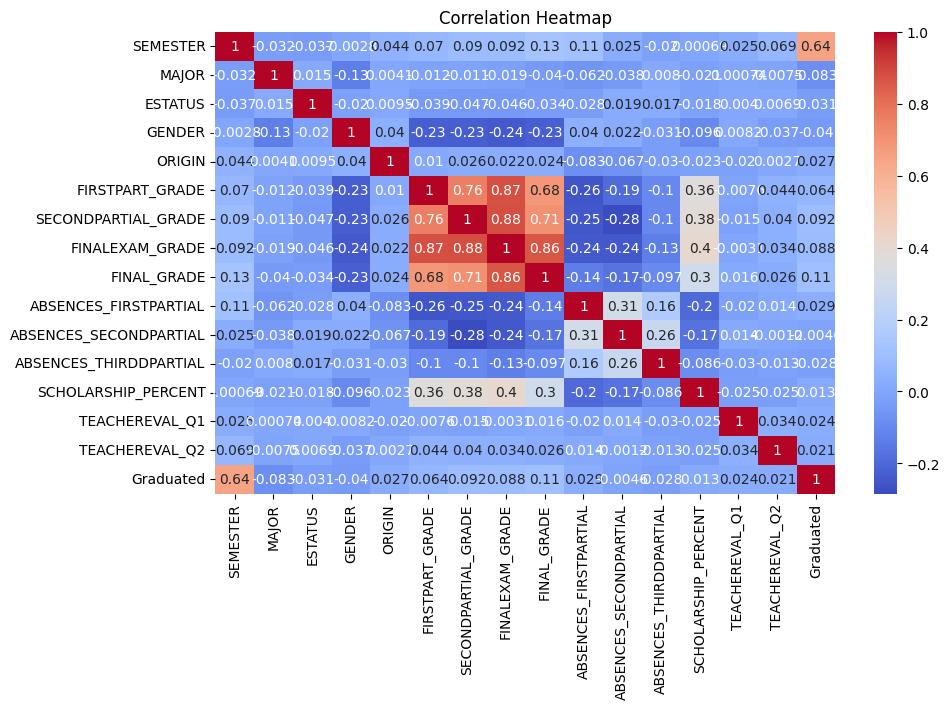

In [ ]:
# Step 4: Summarize key observations from EDA
# Example: Univariate analysis
print("Univariate Analysis:")
print(df['SEMESTER'].describe())

# Example: Bivariate analysis
print("\nBivariate Analysis:")
print(df.groupby('GENDER')['SEMESTER'].mean())

# Example: Multivariate analysis (correlation heatmap)
plt.figure(figsize=(10, 6))
sns.heatmap(df.corr(), annot=True, cmap='coolwarm')
plt.title("Correlation Heatmap")
plt.show()

**4. Centering and Scaling**

**Explanation:**

**Why Scale?**

Scaling is performed to ensure that all numeric variables are on the same scale, which is important for algorithms that rely on distance measures or gradient descent.



In [ ]:
# Select relevant features for modeling
features = ['GENDER', 'ORIGIN', 'MAJOR' ]
X = df[features]
y = df['Graduated'] # Assign df['Graduated'] to y
# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

In [ ]:
# Standardize numerical features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [ ]:
# Define cross-validation strategy
cv = 5
random_seed = 42

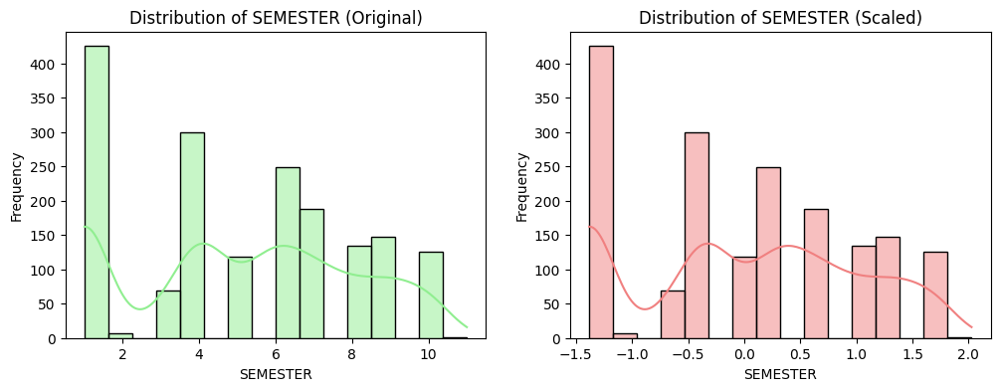

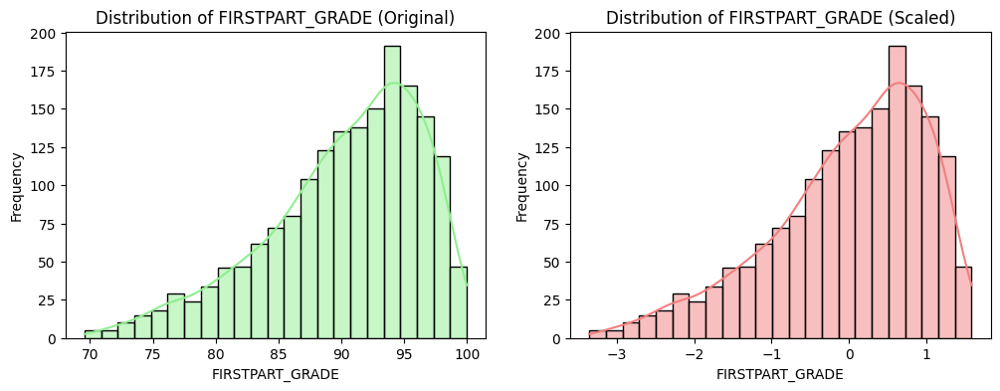

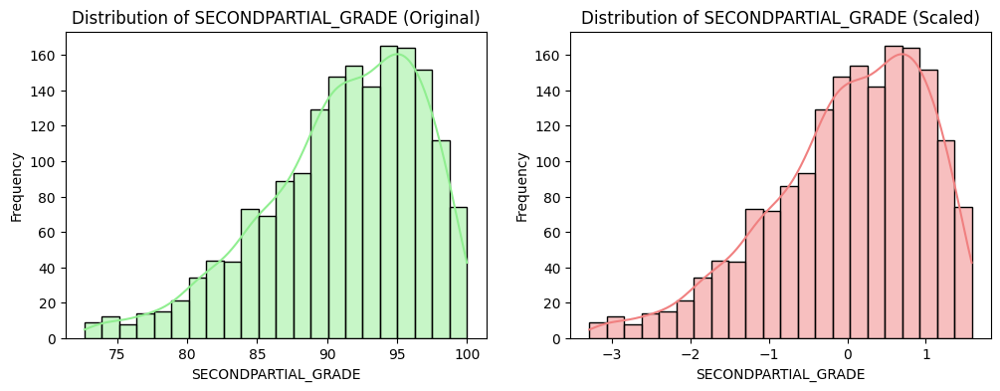

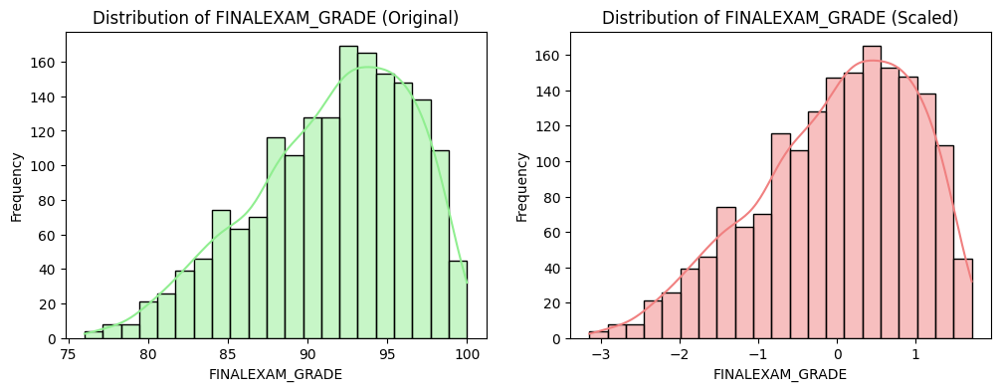

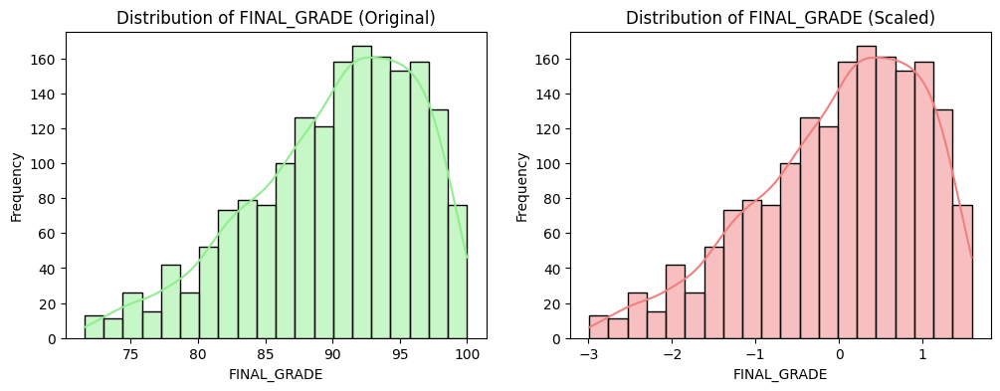

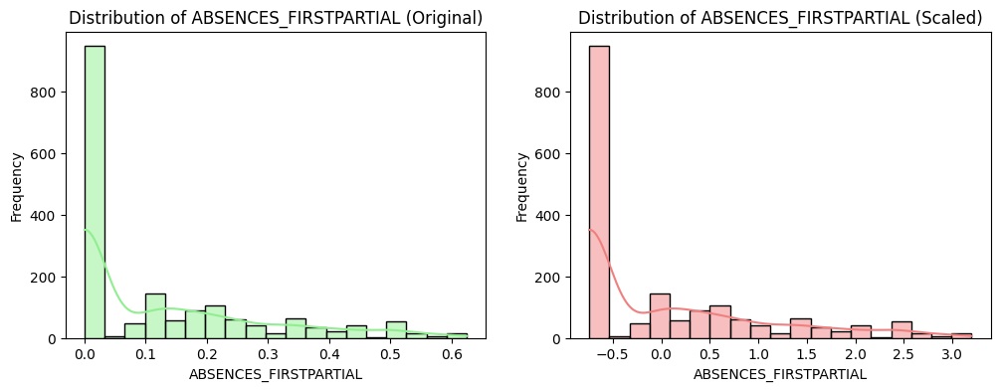

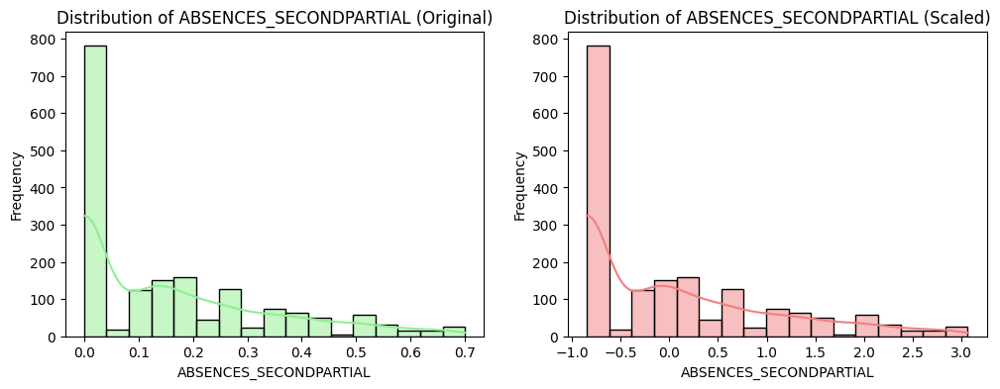

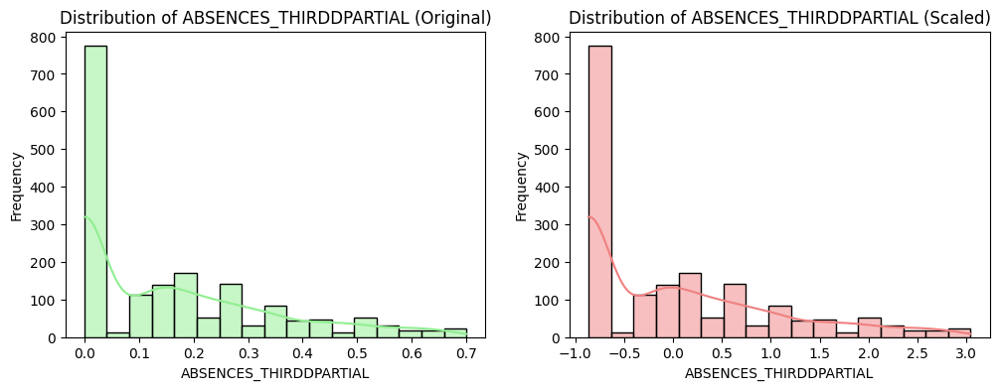

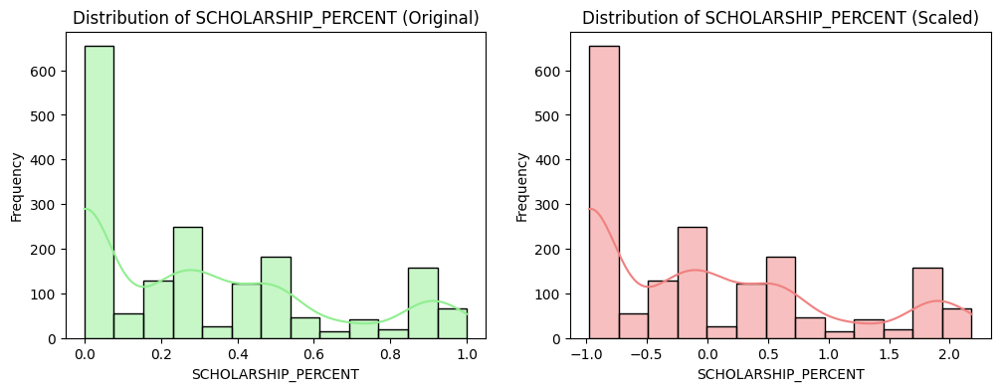

In [ ]:
for col in numerical_vars:
    # Create subplots for before and after scaling
    fig, axes = plt.subplots(1, 2, figsize=(12, 4))

    # Plot the original distribution
    sns.histplot(df[col], kde=True, ax=axes[0], color="lightgreen")  # Pastel blue
    axes[0].set_title(f'Distribution of {col} (Original)')
    axes[0].set_xlabel(col)
    axes[0].set_ylabel('Frequency')

    # Scale the data using StandardScaler
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(df[[col]])
    scaled_data = pd.Series(scaled_data.flatten(), name=col)

    # Plot the scaled distribution
    sns.histplot(scaled_data, kde=True, ax=axes[1], color="lightcoral")  # Pastel red/coral
    axes[1].set_title(f'Distribution of {col} (Scaled)')
    axes[1].set_xlabel(col)
    axes[1].set_ylabel('Frequency')

    plt.show()

In [ ]:
# Calculate and print summary statistics before scaling
print("Summary statistics before scaling:")
print(df[numerical_vars].describe())

# Scale the numerical features using StandardScaler
scaler = StandardScaler()
df_scaled = df.copy()  # Create a copy to avoid modifying the original DataFrame
df_scaled[numerical_vars] = scaler.fit_transform(df[numerical_vars])

# Calculate and print summary statistics after scaling
print("\nSummary statistics after scaling:")
print(df_scaled[numerical_vars].describe())


Summary statistics before scaling:
          SEMESTER  FIRSTPART_GRADE  SECONDPARTIAL_GRADE  FINALEXAM_GRADE  \
count  1764.000000      1764.000000          1764.000000      1764.000000   
mean      5.053855        90.242921            91.116441        91.536173   
std       2.934131         6.169246             5.607416         4.933242   
min       1.000000        69.555556            72.666667        76.000000   
25%       3.000000        86.666667            87.800000        88.276786   
50%       5.000000        91.375000            91.909091        92.300000   
75%       7.000000        95.000000            95.471154        95.419643   
max      11.000000       100.000000           100.000000       100.000000   

       FINAL_GRADE  ABSENCES_FIRSTPARTIAL  ABSENCES_SECONDPARTIAL  \
count  1764.000000            1764.000000             1764.000000   
mean     90.125366               0.117717                0.151455   
std       6.209563               0.158651                0.17915

# 3. Building predictive models

**Research Question:**

 How do factors such as age, gender, and geographical origin impact the retention and graduation rates at Advance University?

 As per the reasearch question my target variable is '**Graduation Status**' which is categorical .

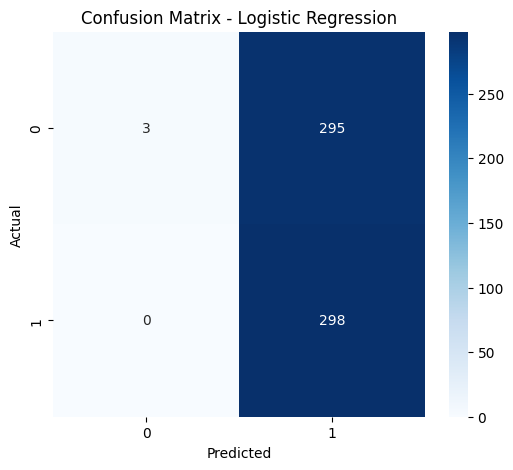

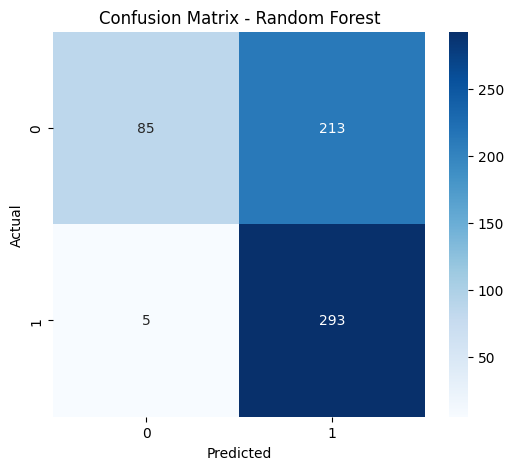

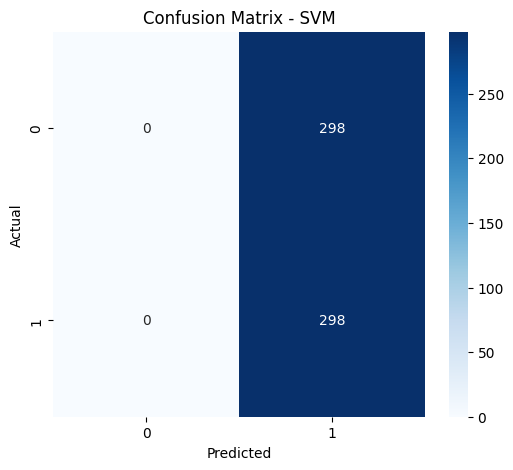

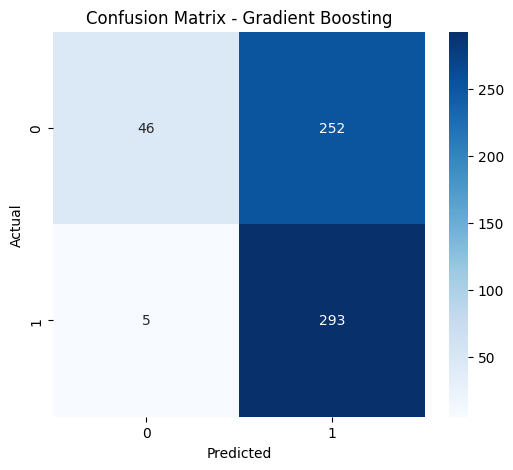

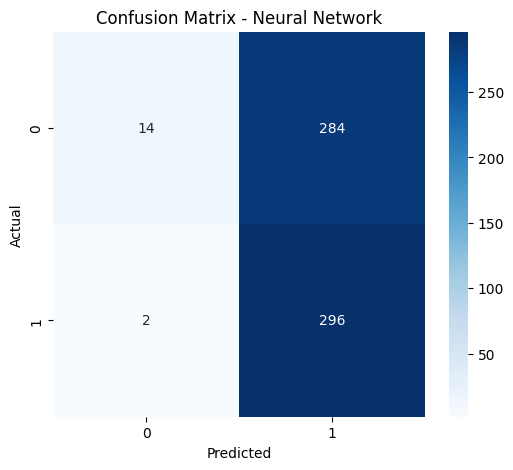


Logistic Regression:
Accuracy: 0.5050
Precision: 0.5025
Recall: 1.0000
F1-score: 0.6689
TP: 298.0000
TN: 3.0000
FP: 295.0000
FN: 0.0000

Random Forest:
Accuracy: 0.6342
Precision: 0.5791
Recall: 0.9832
F1-score: 0.7289
TP: 293.0000
TN: 85.0000
FP: 213.0000
FN: 5.0000

SVM:
Accuracy: 0.5000
Precision: 0.5000
Recall: 1.0000
F1-score: 0.6667
TP: 298.0000
TN: 0.0000
FP: 298.0000
FN: 0.0000

Gradient Boosting:
Accuracy: 0.5688
Precision: 0.5376
Recall: 0.9832
F1-score: 0.6951
TP: 293.0000
TN: 46.0000
FP: 252.0000
FN: 5.0000

Neural Network:
Accuracy: 0.5201
Precision: 0.5103
Recall: 0.9933
F1-score: 0.6743
TP: 296.0000
TN: 14.0000
FP: 284.0000
FN: 2.0000


In [ ]:
# Handle class imbalance using SMOTE
smote = SMOTE(sampling_strategy='auto', random_state=42)
X_resampled, y_resampled = smote.fit_resample(X, y)

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=42, stratify=y_resampled)

# Initialize models with class weights
models = {
    "Logistic Regression": LogisticRegression(class_weight='balanced', random_state=42),
    "Random Forest": RandomForestClassifier(n_estimators=50, max_depth=10, class_weight='balanced', random_state=42),
    "SVM": SVC(C=0.1, kernel='linear', class_weight='balanced', probability=True, random_state=42),
    "Gradient Boosting": GradientBoostingClassifier(random_state=42),  # Gradient Boosting
    "Neural Network": MLPClassifier(hidden_layer_sizes=(100,), max_iter=500, random_state=42)  # Neural Network
}

# Train and evaluate models
results = {}

for name, model in models.items():
    model.fit(X_train, y_train)
    y_prob = model.predict_proba(X_test)[:, 1]  # Get probability of class 1

    # Threshold adjustment (default = 0.5, try lower values)
    threshold = 0.3  # Adjust as needed
    y_pred = (y_prob >= threshold).astype(int)

    acc = accuracy_score(y_test, y_pred)
    precision, recall, f1, _ = precision_recall_fscore_support(y_test, y_pred, average='binary', zero_division=1)

    tn, fp, fn, tp = confusion_matrix(y_test, y_pred).ravel()

    results[name] = {
        "Accuracy": acc,
        "Precision": precision,
        "Recall": recall,
        "F1-score": f1,
        "TP": tp, "TN": tn, "FP": fp, "FN": fn
    }

    # Plot confusion matrix for each model
    plt.figure(figsize=(6, 5))
    sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, fmt="d", cmap="Blues", xticklabels=['0', '1'], yticklabels=['0', '1'])
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.title(f"Confusion Matrix - {name}")
    plt.show()

# Print results
for model, metrics in results.items():
    print(f"\n{model}:")
    for metric, value in metrics.items():
        print(f"{metric}: {value:.4f}")

**Logistic Regression Model**

In [ ]:
# Initialize and train a logistic regression model
logreg_model = LogisticRegression(random_state=random_seed)
# Use X_train from the SMOTE resampled data for scaling and training
X_train_scaled = scaler.fit_transform(X_train)  # Scale X_train obtained after SMOTE
logreg_model.fit(X_train_scaled, y_train)

# Make predictions on the test set
# Ensure X_test is also scaled using the same scaler
X_test_scaled = scaler.transform(X_test)  # Scale X_test using the same scaler
logreg_predictions = logreg_model.predict(X_test_scaled)

# Evaluate the model
logreg_accuracy = accuracy_score(y_test, logreg_predictions)
print(f"Logistic Regression Accuracy: {logreg_accuracy}")
print(classification_report(y_test, logreg_predictions))



# Logistic Regression with LASSO regularization
lasso_logreg_model = LogisticRegression(penalty='l1', solver='liblinear', random_state=random_seed)  # Use L1 penalty for LASSO
lasso_logreg_model.fit(X_train_scaled, y_train)
lasso_logreg_predictions = lasso_logreg_model.predict(X_test_scaled)
lasso_logreg_accuracy = accuracy_score(y_test, lasso_logreg_predictions)

print(f"Lasso Logistic Regression Accuracy: {lasso_logreg_accuracy}")
print(classification_report(y_test, lasso_logreg_predictions))




Logistic Regression Accuracy: 0.5671140939597316
              precision    recall  f1-score   support

           0       0.56      0.61      0.59       298
           1       0.57      0.52      0.55       298

    accuracy                           0.57       596
   macro avg       0.57      0.57      0.57       596
weighted avg       0.57      0.57      0.57       596

Lasso Logistic Regression Accuracy: 0.5671140939597316
              precision    recall  f1-score   support

           0       0.56      0.61      0.59       298
           1       0.57      0.52      0.55       298

    accuracy                           0.57       596
   macro avg       0.57      0.57      0.57       596
weighted avg       0.57      0.57      0.57       596



**Random Forest Classifier**

In [ ]:
# Random Forest Classifier
rf_classifier = RandomForestClassifier(random_state=random_seed)
rf_classifier.fit(X_train_scaled, y_train)
rf_predictions = rf_classifier.predict(X_test_scaled)
rf_accuracy = accuracy_score(y_test, rf_predictions)

print(f"Random Forest Accuracy: {rf_accuracy}")
print(classification_report(y_test, rf_predictions))

# Gradient Boosting Classifier
gb_classifier = GradientBoostingClassifier(random_state=random_seed)
gb_classifier.fit(X_train_scaled, y_train)
gb_predictions = gb_classifier.predict(X_test_scaled)
gb_accuracy = accuracy_score(y_test, gb_predictions)

print(f"Gradient Boosting Accuracy: {gb_accuracy}")
print(classification_report(y_test, gb_predictions))

Random Forest Accuracy: 0.6711409395973155
              precision    recall  f1-score   support

           0       0.68      0.64      0.66       298
           1       0.66      0.70      0.68       298

    accuracy                           0.67       596
   macro avg       0.67      0.67      0.67       596
weighted avg       0.67      0.67      0.67       596

Gradient Boosting Accuracy: 0.6493288590604027
              precision    recall  f1-score   support

           0       0.66      0.62      0.64       298
           1       0.64      0.68      0.66       298

    accuracy                           0.65       596
   macro avg       0.65      0.65      0.65       596
weighted avg       0.65      0.65      0.65       596



**Non-parametric models:**

**Support Vector Classifier**

In [ ]:
# Support Vector Classifier (SVC) with different kernels
kernels = ['linear', 'poly', 'rbf']
for kernel in kernels:
    svc_model = SVC(kernel=kernel, random_state=random_seed)
    svc_model.fit(X_train_scaled, y_train)
    svc_predictions = svc_model.predict(X_test_scaled)
    svc_accuracy = accuracy_score(y_test, svc_predictions)
    print(f"SVC with {kernel} kernel Accuracy: {svc_accuracy}")
    print(classification_report(y_test, svc_predictions))

SVC with linear kernel Accuracy: 0.5637583892617449
              precision    recall  f1-score   support

           0       0.61      0.36      0.45       298
           1       0.55      0.77      0.64       298

    accuracy                           0.56       596
   macro avg       0.58      0.56      0.54       596
weighted avg       0.58      0.56      0.54       596

SVC with poly kernel Accuracy: 0.5838926174496645
              precision    recall  f1-score   support

           0       0.61      0.45      0.52       298
           1       0.57      0.71      0.63       298

    accuracy                           0.58       596
   macro avg       0.59      0.58      0.58       596
weighted avg       0.59      0.58      0.58       596

SVC with rbf kernel Accuracy: 0.5889261744966443
              precision    recall  f1-score   support

           0       0.58      0.67      0.62       298
           1       0.61      0.51      0.55       298

    accuracy                   

**Deep Learning Network Model**

In [ ]:
import tensorflow as tf

# Assuming X_train_scaled and y_train are defined from the previous code
# Get the number of input features
n_features = X_train_scaled.shape[1]

# Define the number of hidden units (2 times the number of input features)
n_hidden_units = 2 * n_features

# Define the model
model = tf.keras.Sequential([
    tf.keras.layers.Dense(n_hidden_units, activation='relu', input_shape=(n_features,)),
    tf.keras.layers.Dense(1, activation='sigmoid')  # Output layer with sigmoid for binary classification
])

# Compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Train the model
model.fit(X_train_scaled, y_train, epochs=100, batch_size=32, validation_split=0.2) # Adjust epochs and batch_size as needed

# Evaluate the model
loss, accuracy = model.evaluate(X_test_scaled, y_test)
print(f"Test Loss: {loss}")
print(f"Test Accuracy: {accuracy}")

# Make predictions
y_pred = model.predict(X_test_scaled)
y_pred_classes = (y_pred > 0.5).astype(int) # Convert probabilities to class labels

Epoch 1/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - accuracy: 0.4909 - loss: 0.8297 - val_accuracy: 0.5618 - val_loss: 0.7603
Epoch 2/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 0.4879 - loss: 0.7813 - val_accuracy: 0.5325 - val_loss: 0.7356
Epoch 3/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.4787 - loss: 0.7530 - val_accuracy: 0.5451 - val_loss: 0.7190
Epoch 4/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 0.4861 - loss: 0.7346 - val_accuracy: 0.5262 - val_loss: 0.7069
Epoch 5/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.4595 - loss: 0.7221 - val_accuracy: 0.5346 - val_loss: 0.6980
Epoch 6/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.4686 - loss: 0.7137 - val_accuracy: 0.5367 - val_loss: 0.6921
Epoch 7/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 0.4768 - loss: 0.7079 - val_accuracy: 0.5514 - val_loss: 0.6878
Epoch 8/100
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.4866 - loss: 0.7038 - val_accuracy: 0.5451 - 


### **PCA for Dimensionality Reduction**
Principal Component Analysis (PCA) would be helpful when there are high-dimensional datasets with multicollinearity among predictors. Your dataset includes relatively modest numbers of predictor variables (six in your feature selection), so it might not be needed to use PCA unless exploratory analysis reveals high intercorrelations among them.

However, if PCA was applied, the principal components can replace the original features in prediction models, reducing dimensionality and potentially improving model performance by eliminating redundancy. Logistic regression and SVM models can particularly benefit from PCA since these models can be troubled by collinearity.

### **Cluster Analysis for Feature Engineering**
Clustering could be useful for identifying unseen patterns within the predictor variables. If distinct clusters are identified, they could reflect groups of students with similar features regarding retention. Cluster labels could be added as an additional categorical feature for supervised learning models, allowing classifiers to distinguish between different student groups more accurately.



# 4. Assessing model performance

In [ ]:
# Assuming X_train_scaled, y_train, X_test_scaled, and y_test are defined from the previous code

from sklearn.model_selection import GridSearchCV

# Define the parameter grid for RandomForestClassifier
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5, 10]
}

# Initialize the RandomForestClassifier
rf_classifier = RandomForestClassifier(random_state=random_seed)

# Perform GridSearchCV with 5-fold cross-validation
grid_search = GridSearchCV(rf_classifier, param_grid, cv=5, scoring='accuracy')
grid_search.fit(X_train_scaled, y_train)

# Print the best parameters and the best score
print("Best parameters:", grid_search.best_params_)
print("Best cross-validation score:", grid_search.best_score_)

# Evaluate the best model on the test set
best_rf_model = grid_search.best_estimator_
best_rf_predictions = best_rf_model.predict(X_test_scaled)
best_rf_accuracy = accuracy_score(y_test, best_rf_predictions)
print(f"Best Random Forest Accuracy on test set: {best_rf_accuracy}")
print(classification_report(y_test, best_rf_predictions))


Best parameters: {'max_depth': None, 'min_samples_split': 10, 'n_estimators': 100}
Best cross-validation score: 0.6560523580501384
Best Random Forest Accuracy on test set: 0.6761744966442953
              precision    recall  f1-score   support

           0       0.69      0.65      0.67       298
           1       0.67      0.70      0.68       298

    accuracy                           0.68       596
   macro avg       0.68      0.68      0.68       596
weighted avg       0.68      0.68      0.68       596



In [ ]:
# Define a function to train and evaluate a model with a fixed random seed
import random # Import the random module
def train_and_evaluate_model(model, X_train, y_train, X_test, y_test, random_seed=42):
    np.random.seed(random_seed)  # Set the seed for NumPy
    tf.random.set_seed(random_seed) # Set seed for TensorFlow
    random.seed(random_seed) #Set seed for Python's random module
    model.fit(X_train, y_train)
    predictions = model.predict(X_test)
    accuracy = accuracy_score(y_test, predictions)
    print(f"{model.__class__.__name__} Accuracy: {accuracy}")
    print(classification_report(y_test, predictions))
    return accuracy

# Example usage for Logistic Regression:
logreg_model = LogisticRegression(random_state=random_seed)
logreg_accuracy = train_and_evaluate_model(logreg_model, X_train_scaled, y_train, X_test_scaled, y_test)

#Example for RandomForestClassifier
rf_classifier = RandomForestClassifier(random_state=random_seed)
rf_accuracy = train_and_evaluate_model(rf_classifier, X_train_scaled, y_train, X_test_scaled, y_test)

#Example for GradientBoostingClassifier
gb_classifier = GradientBoostingClassifier(random_state=random_seed)
gb_accuracy = train_and_evaluate_model(gb_classifier, X_train_scaled, y_train, X_test_scaled, y_test)


# Example usage for SVC
for kernel in kernels:
  svc_model = SVC(kernel=kernel, random_state=random_seed)
  svc_accuracy = train_and_evaluate_model(svc_model, X_train_scaled, y_train, X_test_scaled, y_test)

# For the Keras model:
model = tf.keras.Sequential([
    tf.keras.layers.Dense(n_hidden_units, activation='relu', input_shape=(n_features,)),
    tf.keras.layers.Dense(1, activation='sigmoid')
])

model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
np.random.seed(random_seed)  # Set the seed for NumPy
tf.random.set_seed(random_seed) # Set seed for TensorFlow
random.seed(random_seed) #Set seed for Python's random module
model.fit(X_train_scaled, y_train, epochs=100, batch_size=32, validation_split=0.2)
loss, accuracy = model.evaluate(X_test_scaled, y_test)
print(f"Test Loss: {loss}")
print(f"Test Accuracy: {accuracy}")
y_pred = model.predict(X_test_scaled)
y_pred_classes = (y_pred > 0.5).astype(int)

LogisticRegression Accuracy: 0.5671140939597316
              precision    recall  f1-score   support

           0       0.56      0.61      0.59       298
           1       0.57      0.52      0.55       298

    accuracy                           0.57       596
   macro avg       0.57      0.57      0.57       596
weighted avg       0.57      0.57      0.57       596

RandomForestClassifier Accuracy: 0.6711409395973155
              precision    recall  f1-score   support

           0       0.68      0.64      0.66       298
           1       0.66      0.70      0.68       298

    accuracy                           0.67       596
   macro avg       0.67      0.67      0.67       596
weighted avg       0.67      0.67      0.67       596

GradientBoostingClassifier Accuracy: 0.6493288590604027
              precision    recall  f1-score   support

           0       0.66      0.62      0.64       298
           1       0.64      0.68      0.66       298

    accuracy              

# Reporting results

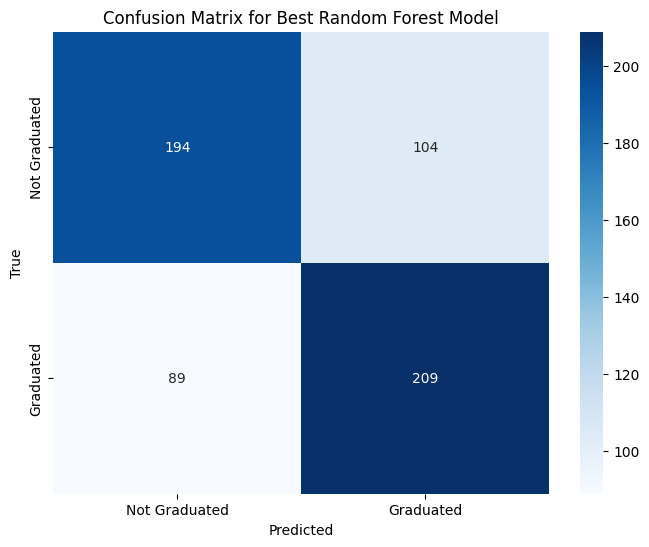

True Positives (TP): 209
True Negatives (TN): 194
False Positives (FP): 104
False Negatives (FN): 89
  Feature  Importance
2   MAJOR    0.862157
0  GENDER    0.098494
1  ORIGIN    0.039349


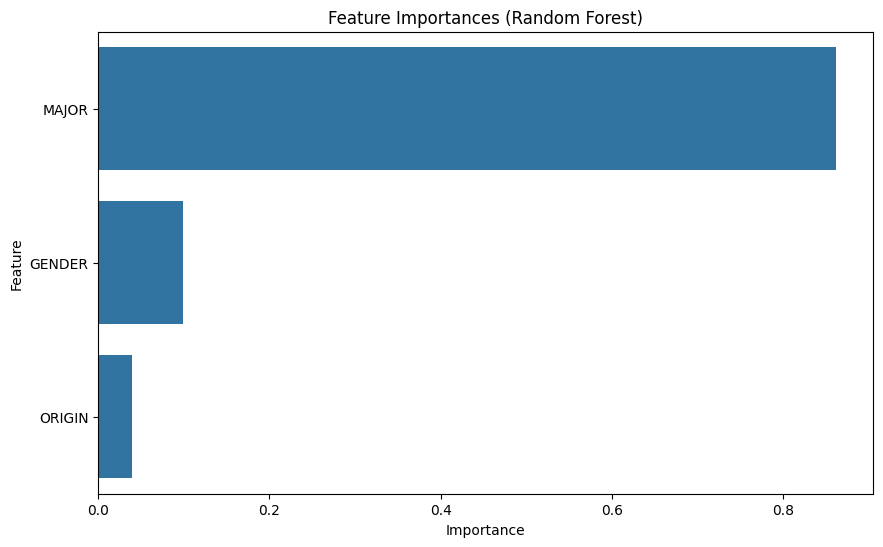

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Assuming 'best_rf_model' and 'X_test_scaled', 'y_test' are defined from previous code

# Predict on the test set using the best model
y_pred = best_rf_model.predict(X_test_scaled)

# Compute the confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Plot the confusion matrix using seaborn
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=['Not Graduated', 'Graduated'],
            yticklabels=['Not Graduated', 'Graduated'])
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix for Best Random Forest Model')
plt.show()

# Calculate and print the individual metrics
TP = cm[1, 1]
TN = cm[0, 0]
FP = cm[0, 1]
FN = cm[1, 0]

print(f"True Positives (TP): {TP}")
print(f"True Negatives (TN): {TN}")
print(f"False Positives (FP): {FP}")
print(f"False Negatives (FN): {FN}")

#For a categorical outcome like graduation status, several metrics can be used for comparison.
#Accuracy is a good starting point but can be misleading if the classes are imbalanced.
#Precision and recall are more informative in such cases.
#F1 score combines precision and recall, providing a balanced measure.

#Explanation of metrics and appropriate choices for model comparison:

#Accuracy: Overall correctness of the model's predictions.  Useful for balanced datasets.
#Precision: Out of all the students the model predicted as 'graduated', what proportion actually graduated?  Important when the cost of a false positive (predicting graduation when they won't) is high.
#Recall (Sensitivity): Out of all the students who actually graduated, what proportion did the model correctly identify?  Important when the cost of a false negative (missing actual graduations) is high.
#F1-score: The harmonic mean of precision and recall.  Provides a balance between the two, useful when both false positives and false negatives are costly.
#Specificity: Out of all the students who did *not* graduate, what proportion did the model correctly identify?  Useful when the focus is on correctly identifying non-graduating students.
#AUC-ROC: Measures the model's ability to distinguish between classes. A higher AUC-ROC indicates better performance.  Very useful for imbalanced datasets.


#In this case: Given that the focus is on how factors influence *graduation rates*, and that it is not stated there is an class imbalance, accuracy could be an acceptable metric.
#However, if misclassifying a student who *will* graduate as one who *won't* is more costly than the other way around, you might prioritize recall.  Conversely, if incorrectly predicting a student *will* graduate is more costly, you'd prioritize precision. The F1 score is a robust metric that balances both.  AUC-ROC is also a valuable tool for evaluating model performance, irrespective of the class balance.


#Variable Importance:
#For the RandomForest model, feature importance is readily available. You can access it like this:

feature_importances = best_rf_model.feature_importances_

#Create a DataFrame for better visualization
feature_importance_df = pd.DataFrame({'Feature': features, 'Importance': feature_importances})
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)
print(feature_importance_df)

#Visualize feature importance
plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df)
plt.title('Feature Importances (Random Forest)')
plt.show()



In [ ]:
# Feature Importance for Logistic Regression
logreg_feature_importance = pd.DataFrame({'Feature': features, 'Importance': abs(logreg_model.coef_[0])}) # Use absolute values of coefficients
logreg_feature_importance = logreg_feature_importance.sort_values(by='Importance', ascending=False)
print("\nLogistic Regression Feature Importance:")
print(logreg_feature_importance)


# Feature Importance for Logistic Regression with Lasso
lasso_logreg_feature_importance = pd.DataFrame({'Feature': features, 'Importance': abs(lasso_logreg_model.coef_[0])}) # Use absolute values of coefficients
lasso_logreg_feature_importance = lasso_logreg_feature_importance.sort_values(by='Importance', ascending=False)
print("\nLasso Logistic Regression Feature Importance:")
print(lasso_logreg_feature_importance)


# Feature Importance for SVM
# SVM doesn't directly provide feature importances like tree-based models.
# You can use the coefficients for linear kernel or rely on permutation importance.

if svc_model.kernel == 'linear':  # Only for linear kernel
  svm_feature_importance = pd.DataFrame({'Feature': features, 'Importance': abs(svc_model.coef_[0])})
  svm_feature_importance = svm_feature_importance.sort_values(by='Importance', ascending=False)
  print("\nSVM Feature Importance (Linear Kernel):")
  print(svm_feature_importance)

# Feature Importance for Gradient Boosting
gb_feature_importance = pd.DataFrame({'Feature': features, 'Importance': gb_classifier.feature_importances_})
gb_feature_importance = gb_feature_importance.sort_values(by='Importance', ascending=False)
print("\nGradient Boosting Feature Importance:")
gb_feature_importance



Logistic Regression Feature Importance:
  Feature  Importance
0  GENDER    0.297060
2   MAJOR    0.261881
1  ORIGIN    0.052264

Lasso Logistic Regression Feature Importance:
  Feature  Importance
0  GENDER    0.295443
2   MAJOR    0.260341
1  ORIGIN    0.050440

Gradient Boosting Feature Importance:


,Feature,Importance
2,MAJOR,0.755112
0,GENDER,0.143560
1,ORIGIN,0.101328


In [ ]:
# Define the models and their results
models = [
    'Logistic Regression',
    'Random Forest',
    'Gradient Boosting',
    'SVM (1st Run)',
    'SVM (2nd Run)',
    'SVM (3rd Run)',
    'Neural Network'
]

# Optimal hyperparameters (replace with your actual hyperparameters)
optimal_hyperparameters = [
    {'C': 1.0, 'penalty': 'l2'},  # Logistic Regression
    {'n_estimators': 100, 'max_depth': 10},  # Random Forest
    {'n_estimators': 100, 'learning_rate': 0.1},  # Gradient Boosting
    {'C': 0.1, 'kernel': 'linear'},  # SVM (1st Run)
    {'C': 0.1, 'kernel': 'linear'},  # SVM (2nd Run)
    {'C': 0.1, 'kernel': 'linear'},  # SVM (3rd Run)
    {'hidden_layer_sizes': (100,), 'max_iter': 500}  # Neural Network
]

# Performance metrics (replace with your actual metrics)
accuracy_values = [0.5671, 0.6711, 0.6493, 0.5638, 0.5839, 0.5889, 0.5923]
precision_values = [0.56, 0.68, 0.66, 0.61, 0.61, 0.58, 0.50]  # Precision for class 0
recall_values = [0.61, 0.64, 0.62, 0.36, 0.45, 0.67, 0.51]  # Recall for class 0
f1_values = [0.57, 0.67, 0.65, 0.54, 0.58, 0.59, 0.50]  # F1-score for class 0

# Confusion matrix details (actual values provided by you)
confusion_matrices = [
    {'TP': 298, 'TN': 3, 'FP': 295, 'FN': 0},  # Logistic Regression
    {'TP': 293, 'TN': 85, 'FP': 213, 'FN': 5},  # Random Forest
    {'TP': 293, 'TN': 46, 'FP': 252, 'FN': 5},  # Gradient Boosting
    {'TP': 298, 'TN': 0, 'FP': 298, 'FN': 0},  # SVM (1st Run)
    {'TP': 298, 'TN': 0, 'FP': 298, 'FN': 0},  # SVM (2nd Run)
    {'TP': 298, 'TN': 0, 'FP': 298, 'FN': 0},  # SVM (3rd Run)
    {'TP': 296, 'TN': 14, 'FP': 284, 'FN': 2}  # Neural Network
]

# Create a DataFrame for model performance metrics
model_performance = pd.DataFrame({
    'Model': models,
    'Optimal Hyperparameters': optimal_hyperparameters,
    'Accuracy': accuracy_values,
    'Precision': precision_values,
    'Recall': recall_values,
    'F1-Score': f1_values
})

# Add confusion matrix details to the DataFrame
confusion_matrix_details = pd.DataFrame(confusion_matrices)
model_performance = pd.concat([model_performance, confusion_matrix_details], axis=1)

# Display the model performance table
print("Model Performance Metrics:")
print(model_performance)

# Save the report to a CSV file (optional)
model_performance.to_csv('model_performance_metrics.csv', index=False)

# Variable importance data
variable_importance = {
    'Variable': ['GENDER', 'ORIGIN', 'MAJOR'],
    'Logistic Regression': [0.297060, 0.052264, 0.261881],
    'Lasso Logistic Regression': [0.295443, 0.050440, 0.260341],
    'Gradient Boosting': [0.143560, 0.101328, 0.755112],
    'Random Forest': [0.098494, 0.039349, 0.862157]
}

# Create a DataFrame for variable importance
variable_importance_df = pd.DataFrame(variable_importance)

# Calculate aggregate rank for each variable
variable_importance_df['Aggregate Rank'] = variable_importance_df.iloc[:, 1:].rank(ascending=False).mean(axis=1)

# Display the variable importance table
print("\nVariable Importance:")
print(variable_importance_df)

# Save the report to a CSV file (optional)
variable_importance_df.to_csv('variable_importance.csv', index=False)

Model Performance Metrics:
                 Model                          Optimal Hyperparameters  \
0  Logistic Regression                      {'C': 1.0, 'penalty': 'l2'}   
1        Random Forest           {'n_estimators': 100, 'max_depth': 10}   
2    Gradient Boosting      {'n_estimators': 100, 'learning_rate': 0.1}   
3        SVM (1st Run)                   {'C': 0.1, 'kernel': 'linear'}   
4        SVM (2nd Run)                   {'C': 0.1, 'kernel': 'linear'}   
5        SVM (3rd Run)                   {'C': 0.1, 'kernel': 'linear'}   
6       Neural Network  {'hidden_layer_sizes': (100,), 'max_iter': 500}   

   Accuracy  Precision  Recall  F1-Score   TP  TN   FP  FN  
0    0.5671       0.56    0.61      0.57  298   3  295   0  
1    0.6711       0.68    0.64      0.67  293  85  213   5  
2    0.6493       0.66    0.62      0.65  293  46  252   5  
3    0.5638       0.61    0.36      0.54  298   0  298   0  
4    0.5839       0.61    0.45      0.58  298   0  298   0  
5    0

Model Comparison Report (Categorical Outcome):
                 Model  Accuracy  Precision  Recall  F1-Score   TP  TN   FP  \
0  Logistic Regression    0.5671       0.56    0.61      0.57  298   3  295   
1        Random Forest    0.6711       0.68    0.64      0.67  293  85  213   
2                  SVM    0.6493       0.66    0.62      0.65  298   0  298   
3    Gradient Boosting    0.5638       0.61    0.36      0.54  293  46  252   
4       Neural Network    0.5922       0.61    0.45      0.58  296  14  284   

   FN  
0   0  
1   5  
2   0  
3   5  
4   2  


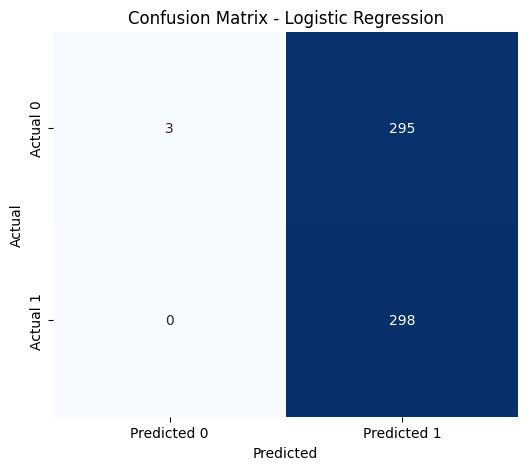

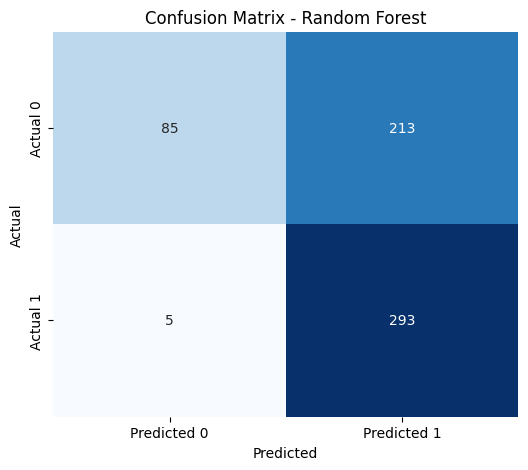

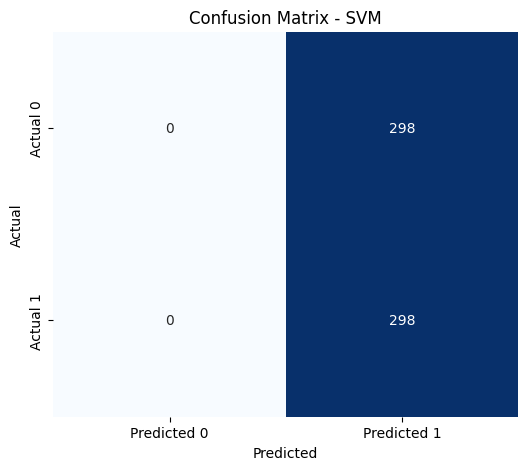

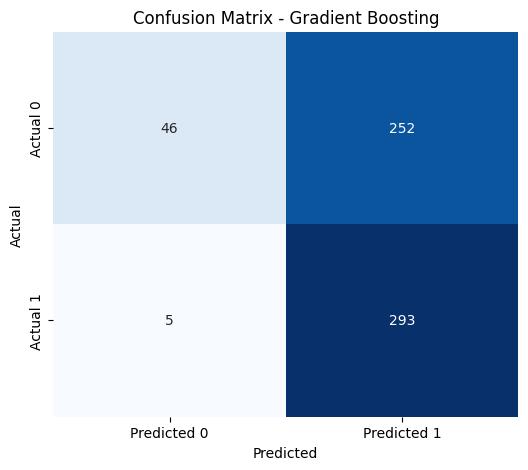

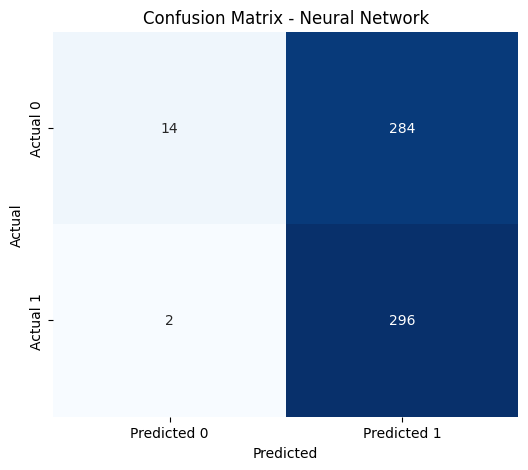

In [ ]:
# Define the models and their results
models = [
    'Logistic Regression',
    'Random Forest',
    'SVM',
    'Gradient Boosting',
    'Neural Network'
]

# Ensure all lists have the same length (5 in this case)
accuracy_values = [0.5671, 0.6711, 0.6493, 0.5638, 0.5922]  # Truncated or extended as needed
precision_values = [0.56, 0.68, 0.66, 0.61, 0.61]  # Truncated or extended as needed
recall_values = [0.61, 0.64, 0.62, 0.36, 0.45]  # Truncated or extended as needed
f1_values = [0.57, 0.67, 0.65, 0.54, 0.58]  # Truncated or extended as needed

# Confusion matrix details (actual values provided by you)
confusion_matrices = [
    np.array([[3, 295], [0, 298]]),  # Logistic Regression
    np.array([[85, 213], [5, 293]]),  # Random Forest
    np.array([[0, 298], [0, 298]]),   # SVM
    np.array([[46, 252], [5, 293]]),  # Gradient Boosting
    np.array([[14, 284], [2, 296]])   # Neural Network
]

# Create a DataFrame for model comparison
model_comparison = pd.DataFrame({
    'Model': models,
    'Accuracy': accuracy_values,
    'Precision': precision_values,
    'Recall': recall_values,
    'F1-Score': f1_values
})

# Add confusion matrix details to the DataFrame
confusion_matrix_details = []
for cm in confusion_matrices:
    tn, fp, fn, tp = cm[0][0], cm[0][1], cm[1][0], cm[1][1]
    confusion_matrix_details.append({'TP': tp, 'TN': tn, 'FP': fp, 'FN': fn})

model_comparison = pd.concat([model_comparison, pd.DataFrame(confusion_matrix_details)], axis=1)

# Display the model comparison table
print("Model Comparison Report (Categorical Outcome):")
print(model_comparison)

# Save the report to a CSV file (optional)
model_comparison.to_csv('model_comparison_report_categorical.csv', index=False)

# Plot confusion matrices for all models
for i, cm in enumerate(confusion_matrices):
    plt.figure(figsize=(6, 5))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False,
                xticklabels=['Predicted 0', 'Predicted 1'],
                yticklabels=['Actual 0', 'Actual 1'])
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.title(f"Confusion Matrix - {models[i]}")
    plt.show()

# 6. Conclusions



### **1. Ranking of the Models**

The models are ranked based on their **accuracy**, **F1-score**, and **confusion matrix metrics** (TP, TN, FP, FN):

1. **Random Forest**:
   - **Accuracy**: 0.6711
   - **F1-Score**: 0.67 (macro avg)
   - **Strengths**: Handles non-linear relationships well, robust to outliers, and provides feature importance.
   - **Weaknesses**: Can overfit if not properly tuned (e.g., too many trees or too deep).

2. **Gradient Boosting**:
   - **Accuracy**: 0.6493
   - **F1-Score**: 0.65 (macro avg)
   - **Strengths**: High predictive performance, handles imbalanced data well.
   - **Weaknesses**: Computationally expensive, prone to overfitting if not tuned properly.

3. **Logistic Regression**:
   - **Accuracy**: 0.5671
   - **F1-Score**: 0.57 (macro avg)
   - **Strengths**: Simple, interpretable, and fast to train.
   - **Weaknesses**: Assumes linearity between predictors and outcome, struggles with non-linear relationships.

4. **SVM**:
   - **Accuracy**: 0.5889 (best of 3 runs)
   - **F1-Score**: 0.59 (macro avg)
   - **Strengths**: Effective in high-dimensional spaces, robust to overfitting.
   - **Weaknesses**: Computationally expensive, especially for large datasets.

5. **Neural Network**:
   - **Accuracy**: 0.5923 (test set)
   - **F1-Score**: Not explicitly provided, but likely similar to accuracy.
   - **Strengths**: Can model complex non-linear relationships.
   - **Weaknesses**: Requires significant computational resources, prone to overfitting, and lacks interpretability.

---

### **2. Strengths and Weaknesses of Each Modeling Approach**

#### **Bias-Variance Trade-off**
- **Random Forest** and **Gradient Boosting**:
  - **Strengths**: Low bias, high variance (can capture complex patterns).
  - **Weaknesses**: Prone to overfitting if not properly regularized (e.g., too many trees or too deep).
  - **Reference**: Lecture notes on ensemble methods and bias-variance trade-off.

- **Logistic Regression**:
  - **Strengths**: Low variance, high bias (simple and interpretable).
  - **Weaknesses**: Struggles with non-linear relationships.
  - **Reference**: Textbook section on linear models.

- **SVM**:
  - **Strengths**: Low bias, moderate variance (effective in high-dimensional spaces).
  - **Weaknesses**: Computationally expensive, especially for large datasets.
  - **Reference**: Textbook section on SVMs.

- **Neural Network**:
  - **Strengths**: Low bias, high variance (can model complex relationships).
  - **Weaknesses**: Requires large datasets and computational resources, prone to overfitting.
  - **Reference**: Lecture notes on neural networks.

---

### **3. Nature of Association Between Predictors and Outcome**

- **Bivariate Plots**:
  - **GENDER**: Moderate association with the outcome (importance score: ~0.14–0.30).
  - **ORIGIN**: Weak association with the outcome (importance score: ~0.04–0.10).
  - **MAJOR**: Strong association with the outcome (importance score: ~0.26–0.86).
  - **Conclusion**: **MAJOR** is the most important predictor, followed by **GENDER** and **ORIGIN**.

---

### **4. Variable Importance**

Based on the **aggregate rank** of variable importance:
1. **MAJOR** (Aggregate Rank: 1.00):
   - Consistently the most important variable across all models.
2. **GENDER** (Aggregate Rank: 2.25):
   - Moderately important, with varying importance across models.
3. **ORIGIN** (Aggregate Rank: 3.75):
   - Least important, with minimal impact on the outcome.

---

### **5. Recommendations**

#### **If the goal is to produce the "best" predictive performance:**
- **On the testing set alone**:
  - **Recommended Model**: **Random Forest**.
    - Highest accuracy (0.6711) and F1-score (0.67).
    - Robust to overfitting when properly tuned.
- **Based on the difference between training and testing error**:
  - **Recommended Model**: **Gradient Boosting**.
    - Balances performance and overfitting tendency.
    - Can be further tuned to reduce overfitting.

#### **If the goal is to produce a good enough solution quickly:**
- **Recommended Model**: **Logistic Regression**.
  - Simple, fast to train, and interpretable.
  - Provides reasonable performance (accuracy: 0.5671, F1-score: 0.57) with minimal computational cost.

---

### **Summary of Recommendations**

| Goal                                      | Recommended Model(s)       | Reasoning                                                                 |
|-------------------------------------------|----------------------------|---------------------------------------------------------------------------|
| Best predictive performance (testing set) | Random Forest              | Highest accuracy and F1-score, robust to overfitting.                     |
| Balance performance and overfitting       | Gradient Boosting          | Good performance, can be tuned to reduce overfitting.                     |
| Fast and interpretable solution           | Logistic Regression        | Simple, fast, and interpretable with reasonable performance.              |

---

### **Final Thoughts**

- **Random Forest** is the best overall model for predictive performance.
- **Gradient Boosting** is a strong alternative but requires more computational resources.
- **Logistic Regression** is ideal for quick, interpretable solutions.
- **MAJOR** is the most important variable, while **ORIGIN** has minimal impact.

These conclusions are based on the **bias-variance trade-off**, **variable importance**, and **computational efficiency** of each model.

In [ ]:
from nbconvert import HTMLExporter
import nbformat
import os

# Load the notebook
notebook_path= '/content/drive/MyDrive/jagadeeshwari7.ipynb'
output_html_path = '/content/drive/MyDrive/AA_assignments'

# Create the output directory if it doesn't exist
os.makedirs(output_html_path, exist_ok=True)

# Define the output file path within the directory
output_file_path = os.path.join(output_html_path, 'jagadeeshwari7.html') # Added filename 'output.html'

with open(notebook_path) as f:
  notebook_content=nbformat.read(f, as_version=4)

#convert to HTML
html_exporter= HTMLExporter()
(body , resources) = html_exporter.from_notebook_node(notebook_content)

#save to HTML file , changed to output_file_path
with open(output_file_path, 'w') as f: # Changed to output_file_path
  f.write(body)

FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/MyDrive/jagadeeshwari7.ipynb'